In [2]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import sklearn.preprocessing
import scipy.sparse
import scipy.io
import sklearn.mixture
import rpy2
from anndata import AnnData
sc.settings.set_figure_params(dpi=100)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


This notebook take the out put from the analysis pipeline: /home/data/anaconda3/bin/python /nfs/lab/projects/pbmc_snATAC/scripts/snATAC_pipeline_10X.py -b cellranger_v1.1/outs/possorted_bam.bam -o lab_pipeline -n pbmc1 -t 24 -m 2 


## Dataset Filenames, Labels, and Parameters

In [3]:
PROJECT_NAME = 'pbmc1_15_10x'

samples = ['pbmc1','pbmc2','pbmc3', "pbmc4", "pbmc5", "pbmc6", "pbmc8", "pbmc9", "pbmc10", "pbmc12",
           'pbmc13', 'pbmc14', 'pbmc15', 'CR2-pbmc-10k-nextgem', 'CR2-pbmc-5k-nextgem', 'CR2-pbmc-1k-nextgem',
           'CR2-pbmc-500-nextgem', 'tenX_atac_pbmc_10k_v1', 'tenX_atac_pbmc_1k_v1', 'tenX_atac_pbmc_500_v1',
           'tenX_atac_pbmc_5k_v1'  ]






wd = '/nfs/lab/jnewsome/pbmc/cluster_Input_Matrix_Softlinks/'
OUTPUT_DIR = '/nfs/lab/jnewsome/pbmc/cluster_Input_Matrix_Softlinks/h5ad/'

QC_FILENAME = '/nfs/lab/jnewsome/pbmc/cluster_Input_Matrix_Softlinks/pbmc1-15_merged_10x2.fixed.qc_metrics.txt'




h5ad_merged_notHarmony_FileName = wd + PROJECT_NAME +  '.merged_samples_v2.merge1.h5ad'
h5ad_merged_hvgFilter = wd + PROJECT_NAME +  '.merged_samples_v2.merge2_hvg.h5ad'
h5ad_merged_merge = wd + PROJECT_NAME +  '.merged_samples_v2.merge3_hvg.h5ad'
h5ad_harmony = wd + PROJECT_NAME +  '.merged_samples_v2.merge4_harmony.h5ad'


# wd2 = '/home/jnewsome/'

figureOutputDir = "/nfs/lab/jnewsome/notebooks_from_PBMC_project_dir/figures/umap/"
# subset_genes = ['CD14','MAFB','IL1B',
#                 'CD19','MS4A1','CD79A',
#                 'CD4','IL2RA','CD3D',
#                 'CD8A','NFIC','FASLG',
#                 'NCAM1','NCR1','SH2D1B',
#                 'ITGA2B','PTGER3','CD9',
#                 'PTCRA','LAMP5','RGS7']
# wd2 = '/home/jnewsome'
# subset_geneCellTypeTable = pd.read_table('/home/jnewsome/gene_marker_celltype_table.txt', sep='\t', header=0)


possibleCellTypeList = ['b_cell', 'b_cell_memory', 'b_cell_naive',
                        'basophil', 'dendritic_cell', 'dendritic_cell_conventional'
                        'dendritic_cell_plasmacytoid', 'eosinophil', 'hematopoietic_stem_cell', 
                        'macrophage', 'megakaryocyte', 'monocyte', 
                        'monocyte_classical', 'monocyte_non-classical', 'neutrophil', 
                        'nk_cell', 'nk_cell_adaptive', 'nk_cell_cytotoxic', 
                        'plasma_cell', 'platelet_activated', 'platelet_resting', 
                        'red_blood_cell', 't_cell', 't_cell_activated', 
                        't_cell_activated_CD4', 't_cell_activated_CD8', 't_cell_naive', 
                        't_cell_CD4', 't_cell_CD8', 
                        't_cell_naive_CD4', 
                        't_cell_naive_CD8', 
                        't_cell_regulatory']
filterStep = 'merge'
subClusterStep = 'merge'

# subset_genes_old = ['CD14','MAFB','IL1B',
#                 'CD19','MS4A1','CD79A',
#                 'CD4','IL2RA','CD3D',
#                 'CD8A','NFIC','FASLG',
#                 'NCAM1','NCR1','SH2D1B',
#                 'ITGA2B','PTGER3','CD9',
#                 'PTCRA','LAMP5','RGS7']


afterLowFripAnnDataFile = wd + PROJECT_NAME +  '.merged_samples_v1.h5ad'
outputAnnDataFile = wd + PROJECT_NAME +  '.merged_samples_v1_afterLowFRIP.h5ad'
outputFilteredBarcodeFile = wd + PROJECT_NAME +  '.merged_v5.aaaaaaa'
low_readsFile  = wd + PROJECT_NAME +  '.round1-4.allMerged.badBarcodes.txt'




WD = wd

In [4]:
# h5ad_noFiltration_Merged_FileName =  "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_15.merged_samples_v1.noFiltration.h5ad"
# h5ad_noLowFripFiltration_Merged_FileName =  "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_15.merged_samples_v1.hvgFilter.NoLowFripRemoval.h5ad"
# h5ad_lowFripRemoved_hvgFilter_Merged_FileName = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_15.merged_samples_v1.hvgFilter.NoLowFripRemoval.h5ad"



# h5ad_hvgFilt_noLowFripFiltration_Merged_FileName =  "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_15.merged_samples_v1.hvgFilter.NoLowFripRemoval.h5ad"
# h5ad_lowFripRemoved_hvgFilter_Merged_FileName = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_15.merged_samples_v1.hvgFilter.LowFripRemoval.h5ad"

# h5ad_noLowFripFiltration_Merged_Harmonized_FileName = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_15.merged_samples_v1.harmonized.NoLowFripRemoval.h5ad"

In [8]:

# qcFileName = '/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/group_for_merge/pbmc1-15_merged.qc_metrics.txt'
qc_metrics = pd.read_table( QC_FILENAME, sep='\t', header=0, index_col=0)



/home/jnewsome/anaconda3/envs/py37_cluster3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3170: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Established Functions:

In [9]:
class GeneCellTypeThing (object):
    def __init__(self, gene, celltypes, title, source):
        self.gene = gene
        self.celltypes = celltypes
        self.title = title
        self.source = source



def getDuplicatedIndices (adata):
    duped = adata.obs.index.duplicated()

    count = 0
    for index1 in adata.obs.index:
        if duped[count]:
            print(index1 + "\t" + str(duped[count]))
        count = count + 1
        
        
def fixCategoricalValuesToNumeric (adata_norm):

    adata_norm.obs['frac_reads_in_peaks'] = pd.to_numeric(adata_norm.obs['frac_reads_in_peaks'])
    adata_norm.obs['frac_reads_in_promoters'] = pd.to_numeric(adata_norm.obs['frac_reads_in_promoters'])
    adata_norm.obs['frac_promoters_used'] = pd.to_numeric(adata_norm.obs['frac_promoters_used'])
    adata_norm.obs['frac_mito_reads'] = pd.to_numeric(adata_norm.obs['frac_mito_reads'])
    adata_norm.obs['frac_duplicated_reads'] = pd.to_numeric(adata_norm.obs['frac_duplicated_reads'])
    return adata_norm


def clusterData (adata_norm, filterStepName, isOutputFigure ):
    figName_umapLeiden = "/cluster_" + filterStepName + "_UMAPLeiden.png"
    figName_umapDonor = "/cluster_" + filterStepName +  "_UMAPsample.png"
    figName_umapLog10Use = "/cluster_" + filterStepName + "_UMAPlog10UseableReads.png"    
    sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0, n_pcs=50)
    sc.tl.leiden(adata_norm, resolution=1.25, random_state=0)
    sc.tl.umap(adata_norm, min_dist=0.3, random_state=0)
    
    if isOutputFigure:
        sc.pl.umap(adata_norm, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters', save=figName_umapLeiden) 
        sc.pl.umap(adata_norm, color=['donor'], size=9, save=figName_umapDonor)
        sc.pl.umap(adata_norm, color=['log10_usable_counts'], size=9, color_map='Blues', save=figName_umapLog10Use)
    else:
        sc.pl.umap(adata_norm, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
        sc.pl.umap(adata_norm, color=['donor'], size=9)
        sc.pl.umap(adata_norm, color=['log10_usable_counts'], size=9, color_map='Blues')
    return adata_norm


def makeOlderVersionMarkerUmaps (adata_norm, filterStepName, isOutputFigure):
    figName_gene1 = "/cluster_" + filterStepName + "_UMAP_marker_gene1.png"
    figName_gene2 = "/cluster_" + filterStepName + "_UMAP_marker_gene2.png"
    figName_gene3 = "/cluster_" + filterStepName + "_UMAP_marker_gene3.png"
    figName_gene4 = "/cluster_" + filterStepName + "_UMAP_marker_gene4.png"
    figName_gene5 = "/cluster_" + filterStepName + "_UMAP_marker_gene5.png"
    figName_gene6 = "/cluster_" + filterStepName + "_UMAP_marker_gene6.png"
    figName_gene7 = "/cluster_" + filterStepName + "_UMAP_marker_gene7.png"
    if isOutputFigure:
        sc.pl.umap(adata_norm, color=['CD14','IL1B','MAFB'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Monocyte marker: CD14','Monocyte marker: IL1B','Monocyte marker: MAFB'], save=figName_gene1)  # Monocyte
        sc.pl.umap(adata_norm, color=['CD4','CD3D','IL2RA'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD4+ T-cell marker: CD4','CD4+ T-cell marker: CD3D','CD4+ T-cell marker: IL2RA'], save=figName_gene2)  # CD4 T-cell
        sc.pl.umap(adata_norm, color=['CD8A','NFIC','FASLG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell marker: CD8A','CD8+ T-cell marker: NFIC','CD8+ T-cell marker: FASLG'], save=figName_gene3)  # CD8 T-cell
        sc.pl.umap(adata_norm, color=['CD19','MS4A1','CD79A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['B-cell marker: CD19','B-cell marker: MS4A1','B-cell marker: CD79A'], save=figName_gene4)  #B-cell 
        sc.pl.umap(adata_norm, color=['NCAM1','NCR1','SH2D1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['NK cell marker: NCAM1 (CD56)','NK cell marker: NCR1','NK cell marker: SH2D1B'], save=figName_gene5)  # NK cell
        sc.pl.umap(adata_norm, color=['ITGA2B','PTGER3','CD9'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocyte marker: ITGA2B (CD41)','Megakaryocyte marker: PTGER3','Megakaryocyte marker: CD9'], save=figName_gene6)  # Megakaryocyte
        sc.pl.umap(adata_norm, color=['PTCRA','LAMP5','RGS7'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Plasmacytoid dendritic cell marker: PTCRA','Plasmacytoid dendritic cell marker: LAMP5','Plasmacytoid dendritic cell marker: RGS7'], save=figName_gene7)  #9
    else:
        sc.pl.umap(adata_norm, color=['CD14','IL1B','MAFB'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Monocyte marker: CD14','Monocyte marker: IL1B','Monocyte marker: MAFB'])  # Monocyte
        sc.pl.umap(adata_norm, color=['CD4','CD3D','IL2RA'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD4+ T-cell marker: CD4','CD4+ T-cell marker: CD3D','CD4+ T-cell marker: IL2RA'])  # CD4 T-cell
        sc.pl.umap(adata_norm, color=['CD8A','NFIC','FASLG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell marker: CD8A','CD8+ T-cell marker: NFIC','CD8+ T-cell marker: FASLG'])  # CD8 T-cell
        sc.pl.umap(adata_norm, color=['CD19','MS4A1','CD79A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['B-cell marker: CD19','B-cell marker: MS4A1','B-cell marker: CD79A'])  #B-cell 
        sc.pl.umap(adata_norm, color=['NCAM1','NCR1','SH2D1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['NK cell marker: NCAM1 (CD56)','NK cell marker: NCR1','NK cell marker: SH2D1B'])  # NK cell
        sc.pl.umap(adata_norm, color=['ITGA2B','PTGER3','CD9'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocyte marker: ITGA2B (CD41)','Megakaryocyte marker: PTGER3','Megakaryocyte marker: CD9'])  # Megakaryocyte
        sc.pl.umap(adata_norm, color=['PTCRA','LAMP5','RGS7'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Plasmacytoid dendritic cell marker: PTCRA','Plasmacytoid dendritic cell marker: LAMP5','Plasmacytoid dendritic cell marker: RGS7'])  #9
    return adata_norm


def makeFracUMAPs (adata_norm, filterStepName, isOutputFigure, outputPlotDir ):
    figName_frip = "/cluster_" + filterStepName + "_UMAP_FRIP.png"
    figName_friprom = "/cluster_" + filterStepName + "_UMAP_FRIPromoters.png"
    figName_fracPromUsed = "/cluster_" + filterStepName + "_UMAP_FracPromUsed.png"
    figName_fracMitoReads = "/cluster_" + filterStepName + "_UMAP_FracMitoReads.png"
    figName_fracDupReads = "/cluster_" + filterStepName + "_UMAP_FracDuplicatedReads.png"
    figName_log10Useable = outputPlotDir + "cluster_" + filterStepName + "_cluster" +  "_log10UseableCounts.png"
    figName_frip2 = outputPlotDir + "cluster_" + filterStepName +  "_FRIP.png"
    
    if isOutputFigure:
        sc.pl.umap(adata_norm, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data', save=figName_frip)
        sc.pl.umap(adata_norm, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data', save=figName_friprom)
        sc.pl.umap(adata_norm, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data', save=figName_fracPromUsed)
        sc.pl.umap(adata_norm, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data', save=figName_fracMitoReads)
        sc.pl.umap(adata_norm, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data', save=figName_fracDupReads)
    
        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm.obs)
        plt.show()
        fig.savefig(figName_log10Useable)

        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm.obs)
        plt.show()
        fig.savefig(figName_frip2)
    
    else:
        sc.pl.umap(adata_norm, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data')
        sc.pl.umap(adata_norm, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data')
        
        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm.obs)
        plt.show()

        fig, ax1 = plt.subplots(1,1,figsize=(7,5))
        sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm.obs)
        plt.show()
    return adata_norm


def adjustDictionary (adataObs, subClusterDict):
    subClusters = adataObs['subset'].unique()
    subClustersReal = list()
    for sub in subClusters:
        if "," in sub:
            subClustersReal.append(sub)
    for subC in subClustersReal:
        list1  = [subC]
        subClusterDict[subC] = adataObs.loc[adataObs['subset'].isin(list1)].index
    return subClusterDict




def getSubCluster (adata, clusterChosen, subset_genes, outputPlotDir, isOutputPlot, filterStepName, subClusterDict):
    figName_umap = "/subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_WholeUMAP.png"
    figName_heatmap = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_heatmap.png"
    figName_umapCluster = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_ClusterUMAP.png"
    figName_log10Useable = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_log10UseableCounts.png"
    figName_frip = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FRIP.png"
    figName_fpu = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FPU.png"
    
    subset_cluster = [clusterChosen]
    sc.tl.louvain(adata, restrict_to=('leiden',subset_cluster), resolution=2, random_state=0, key_added='subset')
    #sc.pl.umap(adata, color=['subset'], size=9)#, legend_loc='on data')
    
    if isOutputPlot:
        sc.pl.umap(adata, color=['subset'], size=9, save=figName_umap)
    
    adata_obs = adata.obs.copy()
    adata_obs['cells'] = 1
    for gene in subset_genes:
        #print(gene)
        thinglyPoof = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
        #print("len obs = " + str(len(adata_obs.index)) + "\t len new cell list = " + str(len(thinglyPoof)))
        adata_obs[gene] = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
    subset_obs = adata_obs.loc[adata_obs['subset'].str.contains(',')]
    subset_pct = pd.DataFrame(index=sorted(set(subset_obs['subset'])))
    for gene in subset_genes:
        subset_pct[gene] = (subset_obs.groupby('subset')[gene].sum()/subset_obs.groupby('subset')['cells'].count()).dropna()
    fig, ax1 = plt.subplots(1,1,figsize=(9,7))
    sns.heatmap(subset_pct, cmap='Reds', yticklabels=1, ax=ax1, vmax=.25)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_heatmap)

    fig, ax1 = plt.subplots(1,1,figsize=(5,5))
    subset = adata.obs.join(pd.DataFrame(adata.obsm['X_umap'], index=adata.obs.index, columns=['UMAP1','UMAP2']), how='inner', rsuffix='_right')
    subset = subset.loc[subset['leiden'].isin(subset_cluster)]
    for s in sorted(set(subset['subset'])):
        ax1.scatter(subset.loc[subset['subset']==s, 'UMAP1'], subset.loc[subset['subset']==s, 'UMAP2'], alpha=1, s=4, label=s)
    ax1.legend(markerscale=3)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_umapCluster)
    
    fig, ax1 = plt.subplots(1,1,figsize=(12,5))
    sns.boxplot(x='subset', y='log10_usable_counts', data=adata.obs, ax=ax1)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_log10Useable)
    
    fig, ax1 = plt.subplots(1,1,figsize=(12,5))
    sns.boxplot(x='subset', y='frac_reads_in_peaks', data=adata.obs, ax=ax1)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_frip)
    
    fig, ax1 = plt.subplots(1,1,figsize=(12,5))
    sns.boxplot(x='subset', y='frac_promoters_used', data=adata.obs, ax=ax1)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
    plt.show()
    if isOutputPlot:
        fig.savefig(figName_fpu)
    
    subClusterDict = adjustDictionary (adata.obs, subClusterDict)
    
    return adata.obs, subClusterDict

def getDFOfRowsToRemove (adata, listOfSubClustersToRemove, subClusterDict):
    removeBarcodes = list()
    for sub in listOfSubClustersToRemove:
       # print(subClusterDict[sub])
       # removeBarcodes = removeBarcodes + subClusterDict[sub]
        for bar in subClusterDict[sub]:
            removeBarcodes.append(bar)
    #print(removeBarcodes)
    removeRows = adata.obs.loc[adata.obs.index.isin(removeBarcodes)]
    return removeRows
    

def makeUMAPGeneHeatmaps (adata_norm, subset_genes, geneCellTypeDict, filterStepName):
    count = 0
    ind = 0
    for pos in range(0, len(subset_genes), 3):
        #figName_genes01_umap = filePrefix + str(count ) + fileSuffix
        figName_genes01_umap =   "/geneUMAP_cluster_" + filterStepName + "_genes_" + str(count) + ".png"
        
        ind = ind + 1
        ind2 = ind + 1
        ind3 = ind + 2
        
        if ind2 > len(subset_genes) and ind3 > len(subset_genes):
            gene1 = subset_genes[pos]
            sc.pl.umap(adata_norm, color=[gene1], size=9, color_map='Blues', 
                       frameon=True, use_raw=True, 
                       title=[newGeneCellTypeDict[gene1].title], save=figName_genes01_umap) 
        elif ind2 > len(subset_genes):
            gene1 = subset_genes[pos]
            gene2 = subset_genes[pos + 1]
            sc.pl.umap(adata_norm, color=[gene1, gene2], size=9, color_map='Blues', 
                       frameon=True, use_raw=True, 
                       title=[newGeneCellTypeDict[gene1].title, 
                              newGeneCellTypeDict[gene2].title], save=figName_genes01_umap) 
        else:
            gene1 = subset_genes[pos]
            gene2 = subset_genes[pos + 1]
            gene3 = subset_genes[pos + 2]
            sc.pl.umap(adata_norm, color=[gene1, gene2, gene3], size=9, color_map='Blues', 
                       frameon=True, use_raw=True, 
                       title=[newGeneCellTypeDict[gene1].title, 
                              newGeneCellTypeDict[gene2].title, 
                              newGeneCellTypeDict[gene3].title], save=figName_genes01_umap) 
        ind = ind3 + 1
        count = count + 1
        
        
def initiateGeneDictAndGeneList (possibleCellTypeList, subset_geneCellTypeTable, adata):
    subClusterDict = dict()
    geneCellTypeDict = dict()
    subset_genes_orig = list()
    for index, row in subset_geneCellTypeTable.iterrows():
        #print(row['c1'], row['c2'])
        gene = row['Gene']
        cellTypes = row['CellType']
        title = row['Title']
        source = row['Sources']
        celltypes = cellTypes.split(";")
        gctt = GeneCellTypeThing(gene, celltypes, title, source)
        geneCellTypeDict[gene] = gctt
        if not gene in subset_genes_orig:
            subset_genes_orig.append(gene)
    newGeneCellTypeDict = dict()
    subset_genes = list()
    for gene in subset_genes_orig:
        if gene in adata.raw.var.index:
            for ct in geneCellTypeDict[gene].celltypes:
                if ct in possibleCellTypeList:
                    newGeneCellTypeDict[gene] = geneCellTypeDict[gene]
                    subset_genes.append(gene)
    return newGeneCellTypeDict, subset_genes

def createAllSubClusters (adata_norm, subClusterDict, subset_genes, figureOutputDir, filterStep, isOutput ):
    clusterNames = adata_norm.obs['leiden'].unique()
    clusterNumbers = list()
    for clust in clusterNames:
        #clust = int(clust)
        #print(clust)
        clusterNumbers.append(int(clust))

    maxCluster = max(clusterNumbers)

    for i in range(0,maxCluster):
        adataObsTemp, subClusterDict =  getSubCluster(
            adata_norm, str(i), subset_genes, 
            figureOutputDir, isOutput, filterStep, subClusterDict)
    return adataObsTemp, subClusterDict

### Experimental Functions:

In [10]:
def makeUMAPGeneHeatmaps_ForSubClusters (adata_norm, subset_genes, geneCellTypeDict, filterStepName, filePrefix, fileSuffix):
    count = 0
    for gene in subset_genes:
        figName_umapCluster = filePrefix + str(count) + fileSuffix
        for s in sorted(set(subset['subset'])):
            ax1.scatter(subset.loc[subset['subset']==s, 'UMAP1'], subset.loc[subset['subset']==s, 'UMAP2'], alpha=1, s=4, label=s, color=[gene])
        ax1.legend(markerscale=3)
        plt.show()
        if isOutputPlot:
            fig.savefig(figName_umapCluster)
        count = count + 1



def getSubCluster_withGeneMarkers (adata, clusterChosen, subset_genes, outputPlotDir, isOutputPlot, filterStepName, subClusterDict, geneCellTypeDict, markerGeneGroupName):
    figName_umap = "/subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_WholeUMAP.png"
    figName_heatmap = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_heatmap.png"
    figName_umapCluster = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_ClusterUMAP.png"
    figName_log10Useable = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_log10UseableCounts.png"
    figName_frip = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FRIP.png"
    figName_fpu = outputPlotDir + "subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen) + "_FPU.png"
    
    figName_umap_prefix = "/subClusterCheck_" + filterStepName + "_cluster" + str(clusterChosen)+ "_" + "_markerGene"
    figName_umap_suffix = ".png"
    subset_cluster = [clusterChosen]
    adata_obs = adata.obs.copy()
    adata_obs['cells'] = 1
    for gene in subset_genes:
        #print(gene)
        thinglyPoof = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
        #print("len obs = " + str(len(adata_obs.index)) + "\t len new cell list = " + str(len(thinglyPoof)))
        adata_obs[gene] = (adata.raw.X[:,adata.raw.var.index.get_loc(gene)].todense().A1 > 0).astype(int)
    subset_obs = adata_obs.loc[adata_obs['subset'].str.contains(',')]
    subset_pct = pd.DataFrame(index=sorted(set(subset_obs['subset'])))
    for gene in subset_genes:
        subset_pct[gene] = (subset_obs.groupby('subset')[gene].sum()/subset_obs.groupby('subset')['cells'].count()).dropna()

    subset = adata.obs.join(pd.DataFrame(adata.obsm['X_umap'], index=adata.obs.index, columns=['UMAP1','UMAP2']), how='inner', rsuffix='_right')
    subset = subset.loc[subset['leiden'].isin(subset_cluster)]
    
    makeUMAPGeneHeatmaps_ForSubClusters (subset, subset_genes, geneCellTypeDict, filterStepName, figName_umap_prefix, figName_umap_suffix)
    return adata.obs, subClusterDict


# Merge samples

In [11]:
adatas = {} 

promoters = pd.read_table('/nfs/lab/jnewsome/references/gencode.v19.5kb_promoter_names.txt', sep='\t', header=None, index_col=0, names=['prom'])
promoter_names = promoters['prom'].to_dict()

for sample in samples:
    print(sample)
#     matrixFileName = WD + sample + '/' + sample + '.mtx.gz'
#     regionsFileName = WD + sample + '/' + sample + '.regions'
#     barcodesFileName = WD + sample + '/' + sample + '.barcodes'
    sp       = scipy.io.mmread(os.path.join(wd, '{}/{}.mtx.gz'.format(sample, sample))).tocsr()
    regions  = open(os.path.join(wd,  '{}/{}.regions'.format(sample, sample))).read().splitlines()
    barcodes = open(os.path.join(wd,  '{}/{}.barcodes'.format(sample, sample))).read().splitlines()
    
    adatas[sample] = AnnData(sp, {'obs_names':barcodes}, {'var_names':regions})
    adatas[sample].var.index = [promoter_names[b] if b in promoter_names else b for b in adatas[sample].var.index]
    adatas[sample].var_names_make_unique(join='.')


pbmc1
pbmc2
pbmc3
pbmc4
pbmc5
pbmc6
pbmc8
pbmc9
pbmc10
pbmc12
pbmc13
pbmc14
pbmc15
CR2-pbmc-10k-nextgem
CR2-pbmc-5k-nextgem
CR2-pbmc-1k-nextgem
CR2-pbmc-500-nextgem
tenX_atac_pbmc_10k_v1
tenX_atac_pbmc_1k_v1
tenX_atac_pbmc_500_v1
tenX_atac_pbmc_5k_v1


In [13]:
adata_merged = AnnData.concatenate(adatas['pbmc1'], adatas['pbmc2'], 
                                   adatas['pbmc3'], adatas['pbmc4'], 
                                   adatas['pbmc5'], adatas['pbmc6'], 
                                   adatas['pbmc8'], 
                                   adatas['pbmc9'], adatas['pbmc10'], 
                                   adatas['pbmc12'], adatas['pbmc13'], 
                                   adatas['pbmc14'],  adatas['pbmc15'],
                                   adatas['CR2-pbmc-10k-nextgem'],
                                   adatas['CR2-pbmc-5k-nextgem'], 
                                   adatas['CR2-pbmc-1k-nextgem'], 
                                   adatas['CR2-pbmc-500-nextgem'], 
                                   adatas['tenX_atac_pbmc_10k_v1'], 
                                   adatas['tenX_atac_pbmc_1k_v1'], 
                                   adatas['tenX_atac_pbmc_500_v1'], 
                                   adatas['tenX_atac_pbmc_5k_v1'],         
                                   batch_key='donor', index_unique=None)
adata_merged.obs['sample'] = [i.split('_')[0] for i in adata_merged.obs.index]

donorDict = {
    'pbmc1' : 'pbmc1',
    'pbmc2' : 'pbmc2',
    'pbmc3' : 'pbmc3',
    'pbmc4' : 'pbmc4',
    'pbmc5' : 'pbmc5',
'pbmc6' : 'pbmc6',
'pbmc8' : 'pbmc8',
'pbmc9' : 'pbmc9',
'pbmc10' : 'pbmc10',
'pbmc12' : 'pbmc12',
'pbmc13' : 'pbmc13',
'pbmc14' : 'pbmc14',
'pbmc15' : 'pbmc15',
'CR2-pbmc-10k-nextgem' : '10x_NextGEM_v1.1_donor',
'CR2-pbmc-5k-nextgem' : '10x_NextGEM_v1.1_donor',
'CR2-pbmc-1k-nextgem' : '10x_NextGEM_v1.1_donor',
'CR2-pbmc-500-nextgem' : '10x_NextGEM_v1.1_donor',
    'tenX_atac_pbmc_10k_v1' : '10x_Kit_v1.0_donor',
    'tenX_atac_pbmc_1k_v1' : '10x_Kit_v1.0_donor',
    'tenX_atac_pbmc_500_v1' : '10x_Kit_v1.0_donor',
    'tenX_atac_pbmc_5k_v1' : '10x_Kit_v1.0_donor' ,

}

batchGroupDict = {
    'pbmc1' : 'old_PBMC',
    'pbmc2' : 'old_PBMC',
    'pbmc3' : 'old_PBMC',
    'pbmc4' : 'old_PBMC',
    'pbmc5' : 'old_PBMC',
'pbmc6' : 'old_PBMC',
'pbmc8' : 'old_PBMC',
'pbmc9' : 'old_PBMC',
'pbmc10' : 'old_PBMC',
'pbmc12' : 'old_PBMC',
'pbmc13' : 'new_PBMC',
'pbmc14' : 'new_PBMC',
'pbmc15' : 'new_PBMC',
'CR2-pbmc-10k-nextgem' : '10x_NextGEM_v1.1_donor',
'CR2-pbmc-5k-nextgem' : '10x_NextGEM_v1.1_donor',
'CR2-pbmc-1k-nextgem' : '10x_NextGEM_v1.1_donor',
'CR2-pbmc-500-nextgem' : '10x_NextGEM_v1.1_donor',
    'tenX_atac_pbmc_10k_v1' : '10x_Kit_v1.0_donor',
    'tenX_atac_pbmc_1k_v1' : '10x_Kit_v1.0_donor',
    'tenX_atac_pbmc_500_v1' : '10x_Kit_v1.0_donor',
    'tenX_atac_pbmc_5k_v1' : '10x_Kit_v1.0_donor' ,

}

techDict = {
    'pbmc1' : '10x_NextGEM_v1.1',
    'pbmc2' : '10x_NextGEM_v1.1',
    'pbmc3' : '10x_NextGEM_v1.1',
    'pbmc4' : '10x_NextGEM_v1.1',
    'pbmc5' : '10x_NextGEM_v1.1',
'pbmc6' : '10x_NextGEM_v1.1',
'pbmc8' : '10x_NextGEM_v1.1',
'pbmc9' : '10x_NextGEM_v1.1',
'pbmc10' : '10x_NextGEM_v1.1',
'pbmc12' : '10x_NextGEM_v1.1',
'pbmc13' : '10x_NextGEM_v1.1',
'pbmc14' : '10x_NextGEM_v1.1',
'pbmc15' : '10x_NextGEM_v1.1',
'CR2-pbmc-10k-nextgem' : '10x_NextGEM_v1.1',
'CR2-pbmc-5k-nextgem' : '10x_NextGEM_v1.1',
'CR2-pbmc-1k-nextgem' : '10x_NextGEM_v1.1',
'CR2-pbmc-500-nextgem' : '10x_NextGEM_v1.1',
    'tenX_atac_pbmc_10k_v1' : '10x_Kit_v1.0',
    'tenX_atac_pbmc_1k_v1' : '10x_Kit_v1.0',
    'tenX_atac_pbmc_500_v1' : '10x_Kit_v1.0',
    'tenX_atac_pbmc_5k_v1' : '10x_Kit_v1.0' ,

}



adata_merged.obs['donor'] = adata_merged.obs['sample'].map(donorDict)
adata_merged.obs['batchGroup'] = adata_merged.obs['sample'].map(batchGroupDict)
adata_merged.obs['tech'] = adata_merged.obs['sample'].map(techDict)

In [14]:
adata_merged.obs

,donor,sample,batchGroup,tech
pbmc1_AAACGAAAGAAAGGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1
pbmc1_AAACGAAAGAGCCTGA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1
pbmc1_AAACGAAAGCGAGAAA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1
pbmc1_AAACGAAAGCTCCGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1
pbmc1_AAACGAAAGTACTCTG,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1
...,...,...,...,...
tenX_atac_pbmc_5k_v1_TTTGTGTGTCTAAAGA,NaN,tenX,NaN,NaN
tenX_atac_pbmc_5k_v1_TTTGTGTGTGTTGTTG,NaN,tenX,NaN,NaN
tenX_atac_pbmc_5k_v1_TTTGTGTTCCATACCC,NaN,tenX,NaN,NaN
tenX_atac_pbmc_5k_v1_TTTGTGTTCCTCCAGT,NaN,tenX,NaN,NaN


## Read and Fix Metrics File

In [15]:
qc_metricsFiltered = qc_metrics[qc_metrics.index.isin(adata_merged.obs.index)]

q1 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc1_')   ]
q2 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc2_')   ]
q3 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc3_')   ]
q4 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc4_')   ]
q5 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc5_')   ]
q6 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc6_')   ]
q8 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc8_')   ]
q9 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc9_')   ]
q10 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc10_')   ]
q12 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc12_')   ]
q13 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc13_')   ]
q14 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc14_')   ]
q15 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('pbmc15_')   ]
q16 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('CR2-pbmc-10k-nextgem_')   ]
q17 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('CR2-pbmc-5k-nextgem_')   ]
q18 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('CR2-pbmc-1k-nextgem_')   ]
q19 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('CR2-pbmc-500-nextgem_')   ]
q20 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('tenX_atac_pbmc_10k_v1_')   ]
q21 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('tenX_atac_pbmc_5k_v1_')   ]
q22 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('tenX_atac_pbmc_1k_v1_')   ]
q23 = qc_metricsFiltered[qc_metricsFiltered.index.str.startswith('tenX_atac_pbmc_500_v1_')   ]


q1.sort_index()
q2.sort_index()
q3.sort_index()
q4.sort_index()
q5.sort_index()
q6.sort_index()
q8.sort_index()
q10.sort_index()
q12.sort_index()
q13.sort_index()
q14.sort_index()
q15.sort_index()
q16.sort_index()
q17.sort_index()
q18.sort_index()
q19.sort_index()
q20.sort_index()
q21.sort_index()
q22.sort_index()
q23.sort_index()



qc_metricsFiltered = pd.concat([q1, q2, q3, q4, q5, q6, q8, q9, q10, q12, q13, q14, q15, q16, q17, q18, q19, q20, q21, q22, q23], axis=0, ignore_index=False, keys=None,
          levels=None, names=None, verify_integrity=False, copy=True)
qc_metrics = qc_metricsFiltered

In [16]:
adata_merged.obs = adata_merged.obs.join(qc_metrics, how='inner')

In [17]:
adata_merged.obs['unique_usable_reads'] = pd.to_numeric(adata_merged.obs['unique_usable_reads'])
adata_merged.obs['log10_unique_usable_reads'] = np.log10(adata_merged.obs['unique_usable_reads']+1)
adata_merged.obs['total_sequenced_reads'] = pd.to_numeric(adata_merged.obs['total_sequenced_reads'])
adata_merged.obs['duplicated_reads'] = pd.to_numeric(adata_merged.obs['duplicated_reads'])
adata_merged.obs['unique_mito_reads'] = pd.to_numeric(adata_merged.obs['unique_mito_reads'])
adata_merged.obs['reads_in_peaks'] = pd.to_numeric(adata_merged.obs['reads_in_peaks'])
adata_merged.obs['reads_in_promoters'] = pd.to_numeric(adata_merged.obs['reads_in_promoters'])
adata_merged.obs['tss_used'] = pd.to_numeric(adata_merged.obs['tss_used'])


In [32]:
adata_merged.obs['frac_reads_in_peaks'] = pd.to_numeric(adata_merged.obs['frac_reads_in_peaks'])
adata_merged.obs['frac_reads_in_promoters'] = pd.to_numeric(adata_merged.obs['frac_reads_in_promoters'])
adata_merged.obs['frac_promoters_used'] = pd.to_numeric(adata_merged.obs['frac_promoters_used'])
adata_merged.obs['frac_mito_reads'] = pd.to_numeric(adata_merged.obs['frac_mito_reads'])
adata_merged.obs['frac_duplicated_reads'] = pd.to_numeric(adata_merged.obs['frac_duplicated_reads'])
adata_merged.obs['log10_unique_usable_reads'] = pd.to_numeric(adata_merged.obs['log10_unique_usable_reads'])


In [33]:
adata_merged.obs

,donor,sample,batchGroup,tech,unique_usable_reads,total_sequenced_reads,duplicated_reads,unique_mito_reads,reads_in_peaks,reads_in_promoters,tss_used,frac_reads_in_peaks,frac_reads_in_promoters,frac_promoters_used,frac_mito_reads,frac_duplicated_reads,log10_unique_usable_reads
pbmc1_AAACGAAAGAAAGGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,18920,27626,8419,146,13178,7862,3114,0.696512,0.415539,0.160964,0.007658,0.304749,4.276944
pbmc1_AAACGAAAGAGCCTGA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,15153,21446,6004,206,11537,7113,2799,0.761367,0.469412,0.144681,0.013412,0.279959,4.180527
pbmc1_AAACGAAAGCGAGAAA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,10532,15859,5106,148,7224,3565,1542,0.685910,0.338492,0.079706,0.013858,0.321962,4.022552
pbmc1_AAACGAAAGCTCCGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,9238,13882,4608,4,6766,4275,1786,0.732410,0.462763,0.092319,0.000433,0.331941,3.965625
pbmc1_AAACGAAAGTACTCTG,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,12723,18557,5423,304,8009,3869,1709,0.629490,0.304095,0.088339,0.023336,0.292235,4.104624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tenX_atac_pbmc_5k_v1_TTTGTGTGTCTAAAGA,NaN,tenX,NaN,NaN,19509,32329,12707,34,15151,9616,3585,0.776616,0.492901,0.185310,0.001740,0.393053,4.290257
tenX_atac_pbmc_5k_v1_TTTGTGTGTGTTGTTG,NaN,tenX,NaN,NaN,40505,80150,39473,0,30050,20352,6018,0.741884,0.502456,0.311072,0.000000,0.492489,4.607519
tenX_atac_pbmc_5k_v1_TTTGTGTTCCATACCC,NaN,tenX,NaN,NaN,26152,45920,19629,0,20639,14313,4779,0.789194,0.547300,0.247028,0.000000,0.427461,4.417522
tenX_atac_pbmc_5k_v1_TTTGTGTTCCTCCAGT,NaN,tenX,NaN,NaN,18546,29991,11341,0,13697,6681,2720,0.738542,0.360239,0.140598,0.000000,0.378147,4.268274


In [34]:
adata_merged.write_h5ad(h5ad_merged_notHarmony_FileName)

In [58]:
adata_merged = sc.read(h5ad_merged_notHarmony_FileName)

Only considering the two last: ['.merge1', '.h5ad'].
Only considering the two last: ['.merge1', '.h5ad'].


In [59]:
listIndex = adata_merged.obs.index.tolist()

In [60]:
listDict = dict()

for l in listIndex:
    
    
    if l.startswith('p'):
        s = l.split('_')
        sample1 = s[0]
        
        listDict[l] = sample1
        
        
    if l.startswith('C'):
        s = l.split('_')
        sample1 = s[0]
    
        listDict[l] = sample1
    
    if l.startswith('tenX_atac_pbmc_10k_v1'):
        listDict[l] = 'tenX_atac_pbmc_10k_v1'
    if l.startswith('tenX_atac_pbmc_1k_v1'):
        listDict[l] = 'tenX_atac_pbmc_1k_v1'
    if l.startswith('tenX_atac_pbmc_500_v1'):
        listDict[l] = 'tenX_atac_pbmc_500_v1'
    if l.startswith('tenX_atac_pbmc_5k_v1'):
        listDict[l] = 'tenX_atac_pbmc_5k_v1'


In [61]:

adata_merged.obs['sample'] = adata_merged.obs.index.map(listDict)
adata_merged.obs['donor'] = adata_merged.obs['sample'].map(donorDict)
adata_merged.obs['batchGroup'] = adata_merged.obs['sample'].map(batchGroupDict)
adata_merged.obs['tech'] = adata_merged.obs['sample'].map(techDict)

In [62]:
adata_merged.obs

,donor,sample,batchGroup,tech,unique_usable_reads,total_sequenced_reads,duplicated_reads,unique_mito_reads,reads_in_peaks,reads_in_promoters,tss_used,frac_reads_in_peaks,frac_reads_in_promoters,frac_promoters_used,frac_mito_reads,frac_duplicated_reads,log10_unique_usable_reads
pbmc1_AAACGAAAGAAAGGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,18920,27626,8419,146,13178,7862,3114,0.696512,0.415539,0.160964,0.007658,0.304749,4.276944
pbmc1_AAACGAAAGAGCCTGA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,15153,21446,6004,206,11537,7113,2799,0.761367,0.469412,0.144681,0.013412,0.279959,4.180527
pbmc1_AAACGAAAGCGAGAAA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,10532,15859,5106,148,7224,3565,1542,0.685910,0.338492,0.079706,0.013858,0.321962,4.022552
pbmc1_AAACGAAAGCTCCGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,9238,13882,4608,4,6766,4275,1786,0.732410,0.462763,0.092319,0.000433,0.331941,3.965625
pbmc1_AAACGAAAGTACTCTG,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,12723,18557,5423,304,8009,3869,1709,0.629490,0.304095,0.088339,0.023336,0.292235,4.104624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tenX_atac_pbmc_5k_v1_TTTGTGTGTCTAAAGA,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,19509,32329,12707,34,15151,9616,3585,0.776616,0.492901,0.185310,0.001740,0.393053,4.290257
tenX_atac_pbmc_5k_v1_TTTGTGTGTGTTGTTG,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,40505,80150,39473,0,30050,20352,6018,0.741884,0.502456,0.311072,0.000000,0.492489,4.607519
tenX_atac_pbmc_5k_v1_TTTGTGTTCCATACCC,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,26152,45920,19629,0,20639,14313,4779,0.789194,0.547300,0.247028,0.000000,0.427461,4.417522
tenX_atac_pbmc_5k_v1_TTTGTGTTCCTCCAGT,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,18546,29991,11341,0,13697,6681,2720,0.738542,0.360239,0.140598,0.000000,0.378147,4.268274


In [63]:
adata_merged.write_h5ad(h5ad_merged_notHarmony_FileName)

... storing 'donor' as categorical
... storing 'sample' as categorical
... storing 'batchGroup' as categorical
... storing 'tech' as categorical


In [64]:


# low_reads  = open(low_readsFile).read().splitlines()
# # doublets   = open(os.path.join(wd,  'merged.doublets')).read().splitlines()
# adata_merged = adata_merged[(~adata_merged.obs.index.isin(low_reads)),:].copy()
# # adata_merged = adata_merged[(~adata_merged.obs.index.isin(doublets)),:].copy()
# # adata_merged = adata_merged[(adata_merged.obs['frac_mito_reads']<=.25),:].copy()


adata_merged_orig = adata_merged.copy()
adata_merged_raw = sc.pp.log1p(adata_merged, copy=True)

sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
adata_merged_filter = sc.pp.filter_genes_dispersion(adata_merged.X, flavor='seurat', n_bins=20)
hvgs = adata_merged.var.loc[adata_merged_filter.gene_subset].index.tolist()
for sample in samples:
    adata_merged.var[sample] = (adata_merged_raw.X > 0)[adata_merged.obs.index.str.contains(sample),:].sum(axis=0).A1
hvgs = adata_merged.var.loc[adata_merged.var.index.isin(hvgs)]
hvgs = hvgs.loc[(hvgs['pbmc1'] > 0) & (hvgs['pbmc2'] > 0) 
                & (hvgs['pbmc3'] > 0) & (hvgs['pbmc4'] > 0) 
                & (hvgs['pbmc5'] > 0) & (hvgs['pbmc6'] > 0)
               & (hvgs['pbmc8'] > 0) & (hvgs['pbmc9'] > 0)
               & (hvgs['pbmc10'] > 0) & (hvgs['pbmc12'] > 0)
                & (hvgs['pbmc13'] > 0) & (hvgs['pbmc14'] > 0)
                & (hvgs['pbmc15'] > 0) & (hvgs['CR2-pbmc-10k-nextgem'] > 0)
                & (hvgs['CR2-pbmc-5k-nextgem'] > 0) & (hvgs['CR2-pbmc-1k-nextgem'] > 0)
               & (hvgs['CR2-pbmc-500-nextgem'] > 0) & (hvgs['tenX_atac_pbmc_10k_v1'] > 0)
                & (hvgs['tenX_atac_pbmc_5k_v1'] > 0) & (hvgs['tenX_atac_pbmc_1k_v1'] > 0)
               & (hvgs['tenX_atac_pbmc_500_v1'] > 0)   ].index

    
    
adata_merged.var = adata_merged.var.drop(samples, axis=1)

normalizing by total count per cell
    finished (0:00:31): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:41)


In [70]:
adata_merged.write_h5ad(h5ad_merged_hvgFilter)

In [71]:
adata_merged = sc.read(h5ad_merged_hvgFilter)

Only considering the two last: ['.merge2_hvg', '.h5ad'].
Only considering the two last: ['.merge2_hvg', '.h5ad'].


In [72]:
lowFripTrackFileName = '/nfs/lab/jnewsome/pbmc_clusters/justBar/pbmc1-15.round1-4.allMerged.badBarcodes.withSampleName.txt'
# barcode \t sample
barList = adata_merged.obs.index.tolist()
lowDict = dict()
for bar in barList:
    lowDict[bar] = 'Not_Filtered'

lowFripTrackFile = open(lowFripTrackFileName)
    
for line in lowFripTrackFile:
    line = line.strip()
    s = line.split('\t')
    bar = s[0]
    sample = s[1]
    lowDict[bar] = sample
    
    
lowFripTrackFile.close()
adata_merged.obs['LowFRIP_Removal'] = adata_merged.obs.index.map(lowDict)

In [73]:
sc.pp.neighbors(adata_merged, n_neighbors=30, method='umap', metric='cosine', random_state=0)
sc.tl.leiden(adata_merged, resolution=1.25, random_state=0)
sc.tl.umap(adata_merged, min_dist=0.3, random_state=0)


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:41)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:06)


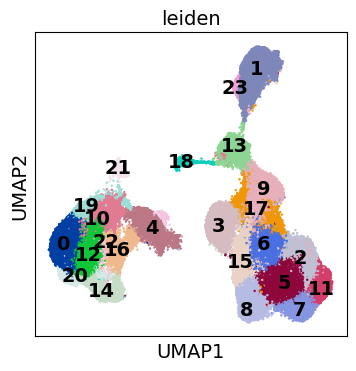

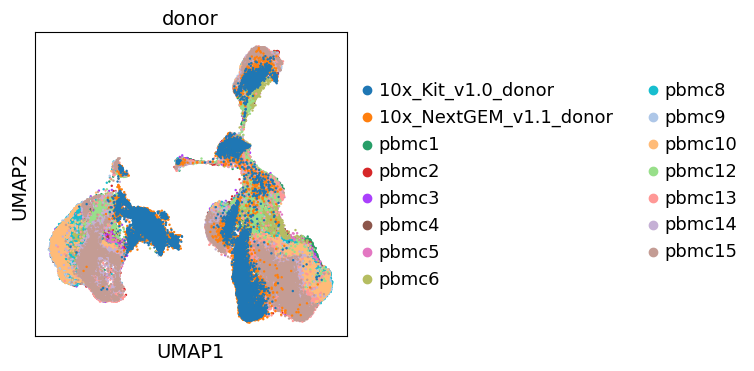

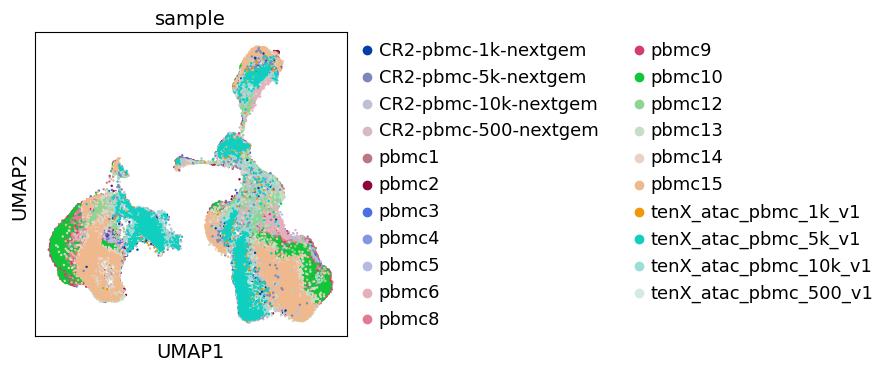

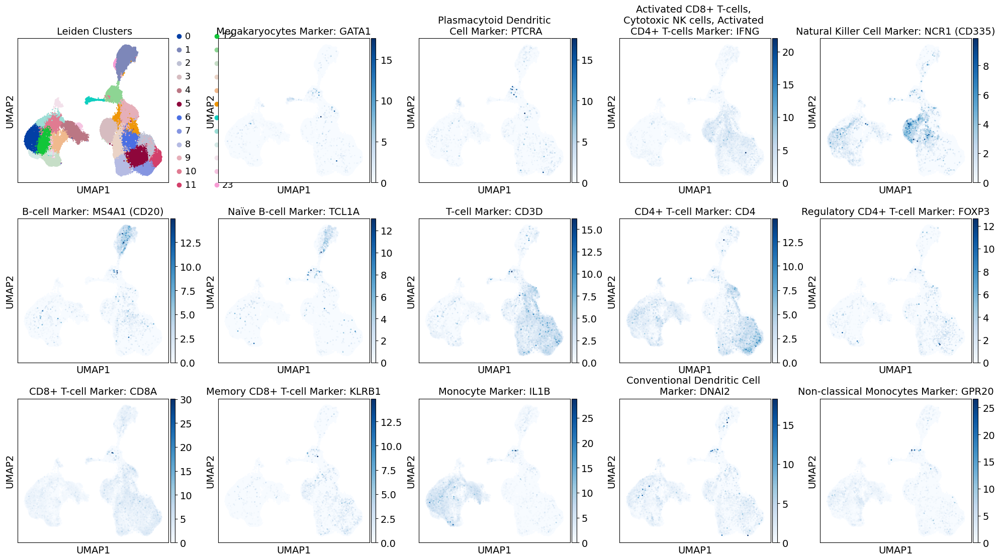

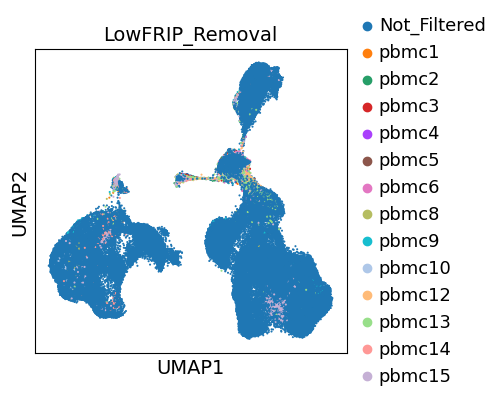

In [81]:

sc.pl.umap(adata_merged, color=['leiden'], size=12, legend_loc='on data')
sc.pl.umap(adata_merged, color=['donor'], size=12, )
sc.pl.umap(adata_merged, color=['sample'], size=12,)
# sc.pl.umap(adata_merged, color=['leiden', 'log10_usable_counts', 'frac_reads_in_peaks', 'frac_reads_in_promoters', 'frac_promoters_used', 'frac_mito_reads', 'frac_duplicated_reads'], ncols=4, color_map='Reds', size=18, legend_loc='on data')



# boxplot of read depth distribution (reads within highly variable windows)
# readDepthTitle = GENERAL_TITLE + " Read Depth Distribution"
# fripTitle = GENERAL_TITLE + " Fraction Reads in Peaks"
# fig, ax1 = plt.subplots(2,1,figsize=(9,11))
# #sns.boxplot(x='leiden', y='log10_usable_counts', ax=ax1[0], data=adata.obs).set_title(readDepthTitle)
# sns.boxplot(x='leiden', y='frac_reads_in_peaks', ax=ax1[1], data=adata.obs).set_title(fripTitle)
# fig.tight_layout()

# plt.show()


leidenTitle =  ' Leiden Clusters'
sc.pl.umap(adata_merged, \
           color= ['leiden', 'GATA1','PTCRA','IFNG', 'NCR1','MS4A1','TCL1A', \
                   'CD3D','CD4','FOXP3', 'CD8A','KLRB1','IL1B', 'DNAI2','GPR20'], \
           size=15, ncols = 5, color_map='Blues', frameon=True, \
           title= [leidenTitle, 'Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA', \
                     'Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG', \
                     'Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A',  \
                     'T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3',  \
                     'CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B', \
                     'Conventional Dendritic Cell \nMarker: DNAI2','Non-classical Monocytes Marker: GPR20'])





sc.pl.umap(adata_merged, color=['LowFRIP_Removal'], size=9, color_map='Blues')


In [82]:
# sc.pp.neighbors(adata_merged, n_neighbors=30, method='umap', metric='cosine', random_state=0)
# sc.tl.leiden(adata_merged, resolution=1.25, random_state=0)
# sc.tl.umap(adata_merged, min_dist=0.3, random_state=0)

# sc.pl.umap(adata_merged, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
# sc.pl.umap(adata_merged, color=['donor'], size=9)
# sc.pl.umap(adata_merged, color=['log10_usable_counts'], size=9, color_map='Blues')
# sc.pl.umap(adata_merged, color=['LowFRIP_Removal'], size=9, color_map='Blues')

# adata_merged.write_h5ad(h5ad_merged_hvgFilter)


# h5ad_merged_notHarmony_FileName = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_12.merged_samples_v2.merge1.h5ad"
# h5ad_merged_hvgFilter = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_12.merged_samples_v2.merge2_hvg.h5ad"
# h5ad_merged_merge = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_12.merged_samples_v2.merge3_hvg.h5ad"
# h5ad_harmony = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_12.merged_samples_v2.merge4_harmony.h5ad"



# adata_merged = sc.read_h5ad(h5ad_hvgFilt_noLowFripFiltration_Merged_FileName)
# adata_merged_orig = sc.read_h5ad(h5ad_noFiltration_Merged_FileName)




In [84]:
adata_merged.obs

,donor,sample,batchGroup,tech,unique_usable_reads,total_sequenced_reads,duplicated_reads,unique_mito_reads,reads_in_peaks,reads_in_promoters,tss_used,frac_reads_in_peaks,frac_reads_in_promoters,frac_promoters_used,frac_mito_reads,frac_duplicated_reads,log10_unique_usable_reads,n_counts,LowFRIP_Removal,leiden
pbmc1_AAACGAAAGAAAGGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,18920,27626,8419,146,13178,7862,3114,0.696512,0.415539,0.160964,0.007658,0.304749,4.276944,19042.0,Not_Filtered,3
pbmc1_AAACGAAAGAGCCTGA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,15153,21446,6004,206,11537,7113,2799,0.761367,0.469412,0.144681,0.013412,0.279959,4.180527,15395.0,Not_Filtered,3
pbmc1_AAACGAAAGCGAGAAA,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,10532,15859,5106,148,7224,3565,1542,0.685910,0.338492,0.079706,0.013858,0.321962,4.022552,10602.0,Not_Filtered,16
pbmc1_AAACGAAAGCTCCGGT,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,9238,13882,4608,4,6766,4275,1786,0.732410,0.462763,0.092319,0.000433,0.331941,3.965625,9260.0,Not_Filtered,6
pbmc1_AAACGAAAGTACTCTG,pbmc1,pbmc1,old_PBMC,10x_NextGEM_v1.1,12723,18557,5423,304,8009,3869,1709,0.629490,0.304095,0.088339,0.023336,0.292235,4.104624,12626.0,Not_Filtered,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tenX_atac_pbmc_5k_v1_TTTGTGTGTCTAAAGA,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,19509,32329,12707,34,15151,9616,3585,0.776616,0.492901,0.185310,0.001740,0.393053,4.290257,19970.0,Not_Filtered,15
tenX_atac_pbmc_5k_v1_TTTGTGTGTGTTGTTG,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,40505,80150,39473,0,30050,20352,6018,0.741884,0.502456,0.311072,0.000000,0.492489,4.607519,41363.0,Not_Filtered,8
tenX_atac_pbmc_5k_v1_TTTGTGTTCCATACCC,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,26152,45920,19629,0,20639,14313,4779,0.789194,0.547300,0.247028,0.000000,0.427461,4.417522,26794.0,Not_Filtered,15
tenX_atac_pbmc_5k_v1_TTTGTGTTCCTCCAGT,10x_Kit_v1.0_donor,tenX_atac_pbmc_5k_v1,10x_Kit_v1.0_donor,10x_Kit_v1.0,18546,29991,11341,0,13697,6681,2720,0.738542,0.360239,0.140598,0.000000,0.378147,4.268274,18921.0,Not_Filtered,4


In [86]:
%%time 

adata_ind = {}
for sample in sorted(set(adata_merged.obs['sample'])):
    patternThing = sample + "_"
    adata_ind[sample] = adata_merged[adata_merged.obs.index.str.contains(patternThing), :]
    adata_ind[sample] = adata_ind[sample][:, adata_merged.var.index.isin(hvgs)]
    sc.pp.log1p(adata_ind[sample])
    adata_ind_orig = adata_merged_orig[adata_merged_orig.obs.index.str.contains(patternThing), :]
    adata_ind[sample].obs['log10_usable_counts'] = np.log10(adata_ind_orig[:, adata_ind_orig.var.index.isin(hvgs)].X.sum(axis=1).A1)
    sc.pp.regress_out(adata_ind[sample], ['log10_usable_counts'])
    
adata_merged_orig = adata_ind_orig = None
adata_norm = AnnData.concatenate(adata_ind['pbmc1'], adata_ind['pbmc2'], 
                                 adata_ind['pbmc3'], adata_ind['pbmc4'], 
                                 adata_ind['pbmc5'], adata_ind['pbmc6'], 
                                 adata_ind['pbmc8'], adata_ind['pbmc9'],
                                 adata_ind['pbmc10'],  adata_ind['pbmc12'],
        
                                 adata_ind['pbmc13'],
                                 adata_ind['pbmc14'],
                                 adata_ind['pbmc15'],
                                 adata_ind['CR2-pbmc-10k-nextgem'],
                                 adata_ind['CR2-pbmc-5k-nextgem'],
                                 adata_ind['CR2-pbmc-1k-nextgem'],
                                 adata_ind['CR2-pbmc-500-nextgem'],
                                 adata_ind['tenX_atac_pbmc_10k_v1'],
                                 adata_ind['tenX_atac_pbmc_5k_v1'],
                                 adata_ind['tenX_atac_pbmc_1k_v1'],
                                 adata_ind['tenX_atac_pbmc_500_v1'],
                                                     
                                 batch_key='norm', index_unique=None)
adata_norm.raw = adata_merged_raw.copy()

sc.pp.scale(adata_norm)
sc.tl.pca(adata_norm, zero_center=False, random_state=0)
pc = pd.DataFrame(adata_norm.obsm['X_pca'], columns=['PC{}'.format(i) for i in range(1,51)], index=adata_norm.obs.index)
donor = adata_norm.obs['donor'].tolist()





regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:01:34)
regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:11)
regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:10)
regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:55)
regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:01:35)
regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:01:11)
regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:01:32)
regressing out ['log10_usable_counts']
    sparse input is densified and may lead to high memory use
    finished (0:01:59)
regressi

CPU times: user 10h 16min 35s, sys: 19h 3min 47s, total: 1d 5h 20min 23s
Wall time: 24min 43s


In [87]:
# pc

In [88]:
def unique(list1):
 
    # intilize a null list
    unique_list = []
     
    # traverse for all elements
    for x in list1:
        # check if exists in unique_list or not
        if x not in unique_list:
            unique_list.append(x)
    # print list
    for x in unique_list:
        print (x)

In [89]:
len(donor)

148771

In [90]:
unique(donor)

pbmc1
pbmc2
pbmc3
pbmc4
pbmc5
pbmc6
pbmc8
pbmc9
pbmc10
pbmc12
pbmc13
pbmc14
pbmc15
10x_NextGEM_v1.1_donor
10x_Kit_v1.0_donor


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:37)
running Leiden clustering
    finished: found 28 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:51)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:57)
... storing 'donor' as categorical
... storing 'sample' as categorical
... storing 'batchGroup' as categorical
... storing 'tech' as categorical
... storing 'LowFRIP_Removal' as categorical


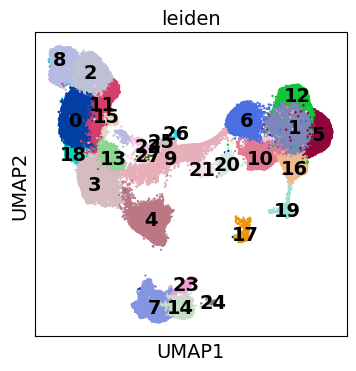

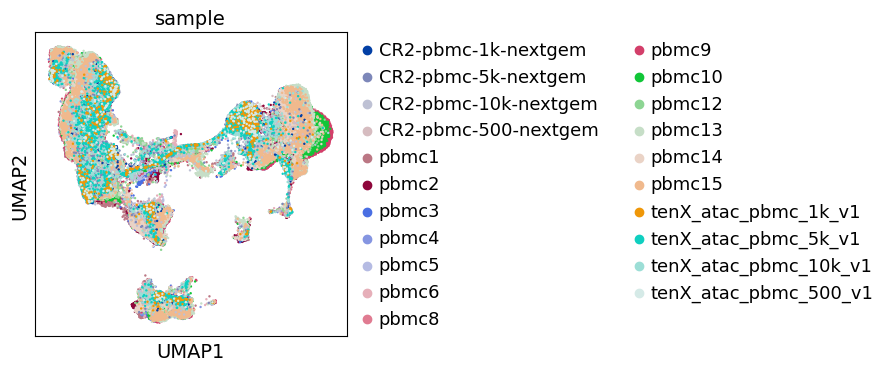

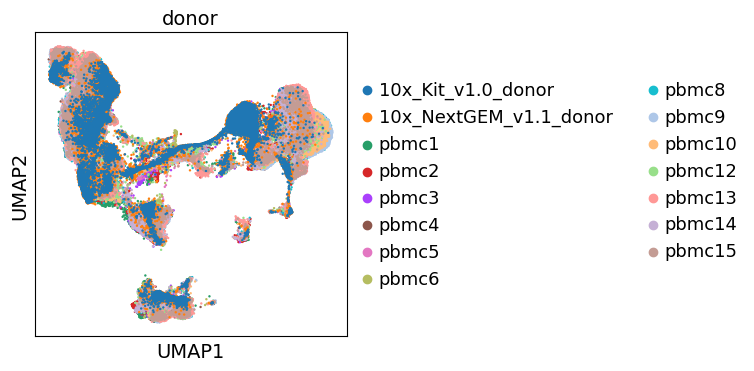

NameError: name 'GENERAL_TITLE' is not defined

In [91]:
sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0)
sc.tl.leiden(adata_norm, resolution=1.25, random_state=0)
sc.tl.umap(adata_norm, min_dist=0.3, random_state=0)

sc.pl.umap(adata_norm, color=['leiden'], size=12, legend_loc='on data')
sc.pl.umap(adata_norm, color=['sample'], size=12,)
sc.pl.umap(adata_norm, color=['donor'], size=12,)
sc.pl.umap(adata_norm, color=['batchGroup'], size=12,)
# sc.pl.umap(adata_norm, color=['leiden', 'log10_usable_counts', 'frac_reads_in_peaks', 'frac_reads_in_promoters', 'frac_promoters_used', 'frac_mito_reads', 'frac_duplicated_reads'], ncols=4, color_map='Reds', size=18, legend_loc='on data')



# # boxplot of read depth distribution (reads within highly variable windows)
# readDepthTitle = GENERAL_TITLE + " Read Depth Distribution"
# fripTitle = GENERAL_TITLE + " Fraction Reads in Peaks"
# fig, ax1 = plt.subplots(2,1,figsize=(9,11))
# sns.boxplot(x='leiden', y='log10_usable_counts', ax=ax1[0], data=adata_norm.obs).set_title(readDepthTitle)
# sns.boxplot(x='leiden', y='frac_reads_in_peaks', ax=ax1[1], data=adata_norm.obs).set_title(fripTitle)
# fig.tight_layout()

# plt.show()




In [92]:
h5ad_merged_norm = wd + PROJECT_NAME +  '.merged_samples_v2.merge4_normalized.h5ad'
adata_norm.write_h5ad(h5ad_merged_norm)

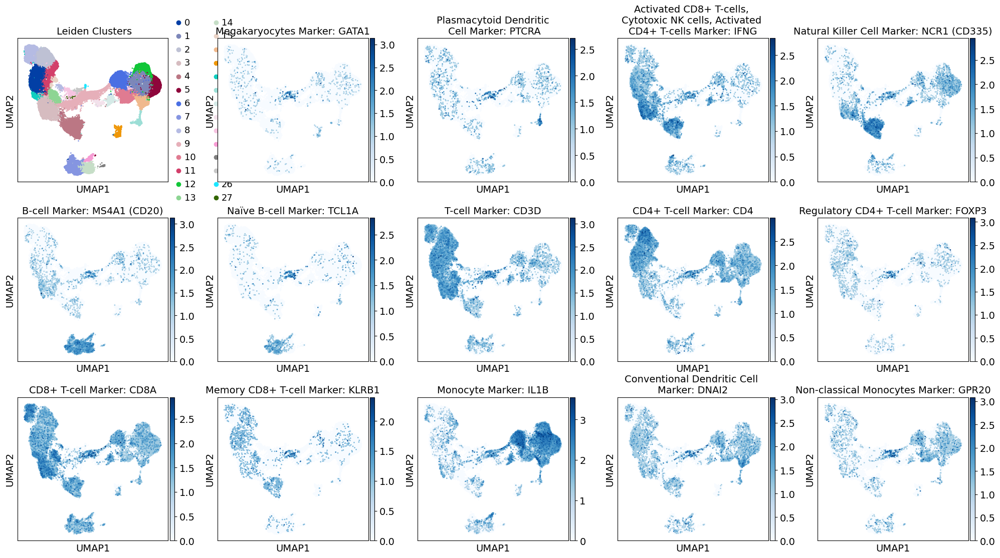

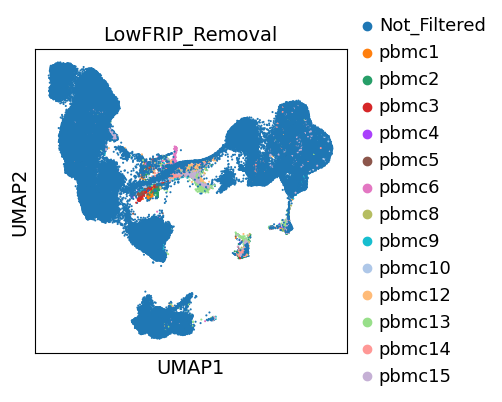

In [93]:

leidenTitle =  ' Leiden Clusters'
sc.pl.umap(adata_norm, \
           color= ['leiden', 'GATA1','PTCRA','IFNG', 'NCR1','MS4A1','TCL1A', \
                   'CD3D','CD4','FOXP3', 'CD8A','KLRB1','IL1B', 'DNAI2','GPR20'], \
           size=15, ncols = 5, color_map='Blues', frameon=True, use_raw=True,  \
           title= [leidenTitle, 'Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA', \
                     'Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG', \
                     'Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A',  \
                     'T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3',  \
                     'CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B', \
                     'Conventional Dendritic Cell \nMarker: DNAI2','Non-classical Monocytes Marker: GPR20'])

sc.pl.umap(adata_norm, color=['LowFRIP_Removal'], size=9, color_map='Blues')





In [97]:
metadata = adata_norm.obs[['sample', 'batchGroup']]


In [98]:
metadata

,sample,batchGroup
pbmc1_AAACGAAAGAAAGGGT,pbmc1,old_PBMC
pbmc1_AAACGAAAGAGCCTGA,pbmc1,old_PBMC
pbmc1_AAACGAAAGCGAGAAA,pbmc1,old_PBMC
pbmc1_AAACGAAAGCTCCGGT,pbmc1,old_PBMC
pbmc1_AAACGAAAGTACTCTG,pbmc1,old_PBMC
...,...,...
tenX_atac_pbmc_500_v1_TTTGGTTCAGGCACAA,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor
tenX_atac_pbmc_500_v1_TTTGGTTTCATGTTCT,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor
tenX_atac_pbmc_500_v1_TTTGTGTCACAGTTAC,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor
tenX_atac_pbmc_500_v1_TTTGTGTTCCTAAAGC,tenX_atac_pbmc_500_v1,10x_Kit_v1.0_donor


In [101]:
metadata2 = metadata.copy()

In [104]:
from rpy2.robjects import r, pandas2ri
pandas2ri.activate()


metadata = rpy2.robjects.conversion.py2rpy(metadata2)

In [108]:
%%R -i pc -i metadata -o harmonized
.libPaths(c('/home/jnewsome/anaconda3/envs/py37_cluster3_R/bin/R', 
            '/home/jnewsome/anaconda3/envs/py37_cluster3_R/lib/R',
            '/home/jnewsome/anaconda3/envs/py37_cluster3_R/lib/R/library'))


# do PCA = False
library(harmony)
library(magrittr)

# remove batch effects with harmony
# donor <- as.factor(unlist(donor))
harmonized <- HarmonyMatrix(pc, metadata, c("sample", "batchGroup"), theta=c(2,2), do_pca = FALSE)
harmonized <- data.frame(harmonized)


R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write t

In [109]:
# harmonized.values

In [110]:
# harmonized.shape

In [111]:
adata_norm.obsm['X_pca'] = harmonized.values
# adata_norm = clusterData (adata_norm, filterStep, True )

In [112]:
adata_norm.write_h5ad(h5ad_harmony)

In [113]:
sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0, n_pcs = 50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)


In [114]:
# figName_umapLeiden = "/cluster_" + filterStepName + "_UMAPLeiden.png"
# figName_umapDonor = "/cluster_" + filterStepName +  "_UMAPsample.png"
# figName_umapLog10Use = "/cluster_" + filterStepName + "_UMAPlog10UseableReads.png"    
#sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0)
sc.tl.leiden(adata_norm, resolution=1.25, random_state=0)
sc.tl.umap(adata_norm, min_dist=0.3, random_state=0)



running Leiden clustering
    finished: found 27 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:38)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:12)


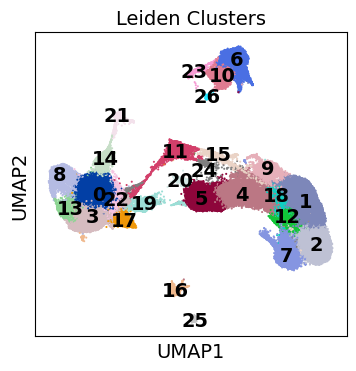

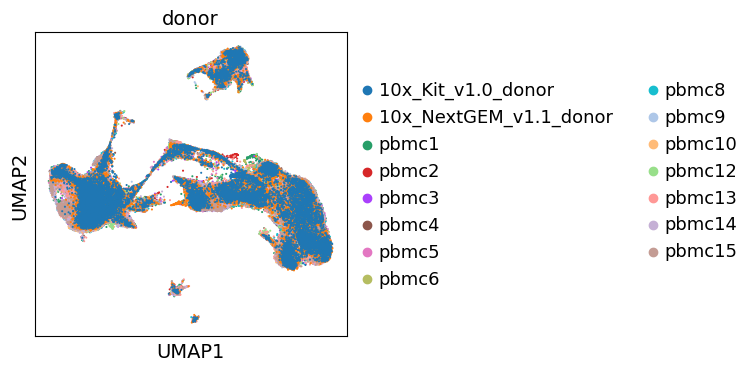

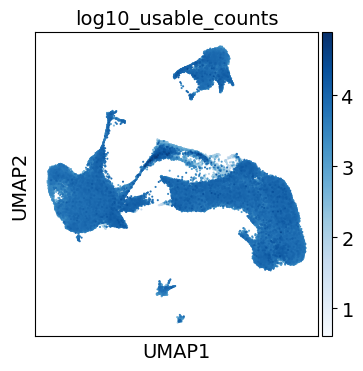

In [115]:
sc.pl.umap(adata_norm, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
sc.pl.umap(adata_norm, color=['donor'], size=9)
sc.pl.umap(adata_norm, color=['log10_usable_counts'], size=9, color_map='Blues')


In [116]:
# # plot marker promoter on UMAP coordinates
# sc.pl.umap(adata_norm, color=['GATA1','PTCRA','IFNG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA','Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG']) 
# sc.pl.umap(adata_norm, color=['NCR1','MS4A1','TCL1A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A']) # 
# sc.pl.umap(adata_norm, color=['CD3D','CD4','FOXP3'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3']) # 
# sc.pl.umap(adata_norm, color=['CD8A','KLRB1','IL1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B']) # 
# sc.pl.umap(adata_norm, color=['DNAI2','GPR20'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Conventional Dendritic Cell Marker: DNAI2','Non-classical Monocytes Marker: GPR20']) # 

In [117]:
adata_norm = fixCategoricalValuesToNumeric (adata_norm)

In [118]:
adata_norm.obs['LowFRIP_Removal']

pbmc1_AAACGAAAGAAAGGGT                    Not_Filtered
pbmc1_AAACGAAAGAGCCTGA                    Not_Filtered
pbmc1_AAACGAAAGCGAGAAA                    Not_Filtered
pbmc1_AAACGAAAGCTCCGGT                    Not_Filtered
pbmc1_AAACGAAAGTACTCTG                    Not_Filtered
                                              ...     
tenX_atac_pbmc_500_v1_TTTGGTTCAGGCACAA    Not_Filtered
tenX_atac_pbmc_500_v1_TTTGGTTTCATGTTCT    Not_Filtered
tenX_atac_pbmc_500_v1_TTTGTGTCACAGTTAC    Not_Filtered
tenX_atac_pbmc_500_v1_TTTGTGTTCCTAAAGC    Not_Filtered
tenX_atac_pbmc_500_v1_TTTGTGTTCGATGTAC    Not_Filtered
Name: LowFRIP_Removal, Length: 148771, dtype: category
Categories (14, object): ['Not_Filtered', 'pbmc1', 'pbmc2', 'pbmc3', ..., 'pbmc12', 'pbmc13', 'pbmc14', 'pbmc15']

In [119]:
# adata_norm.obs['LowFRIP_Removal'] = adata_norm.obs['LowFRIP_Removal'].replace(['Not_Filtered'], np.nan)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:35)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:37)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:01)


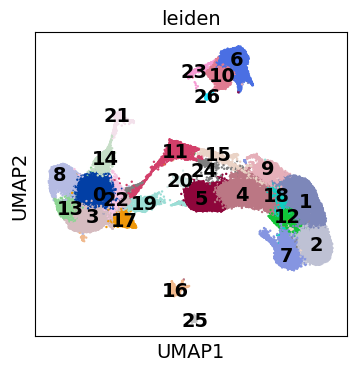

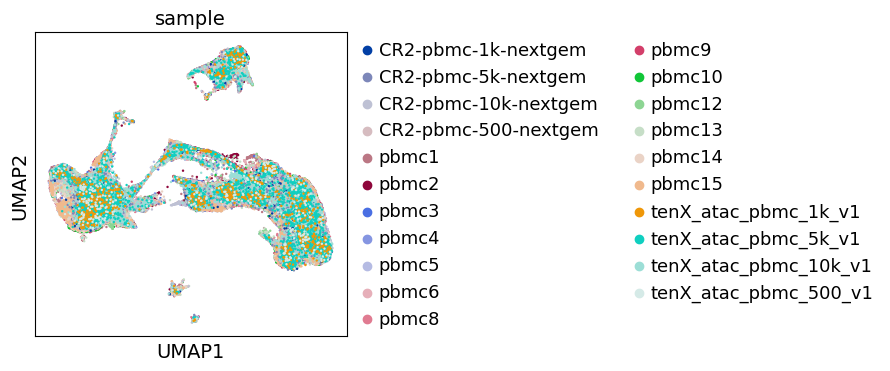

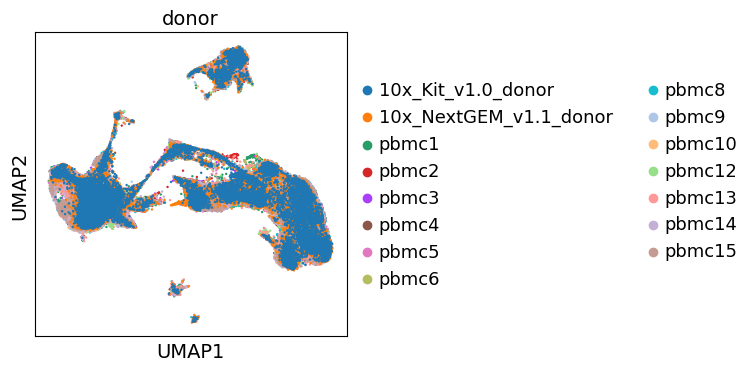

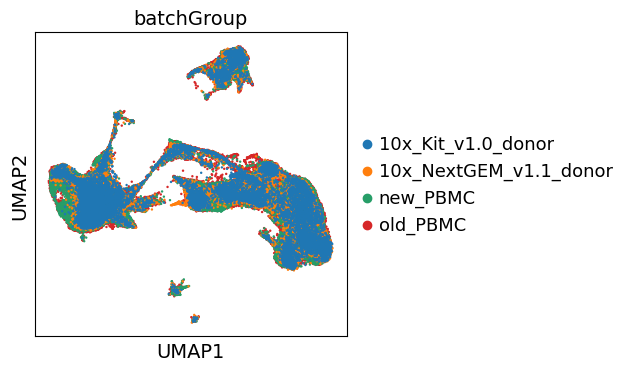

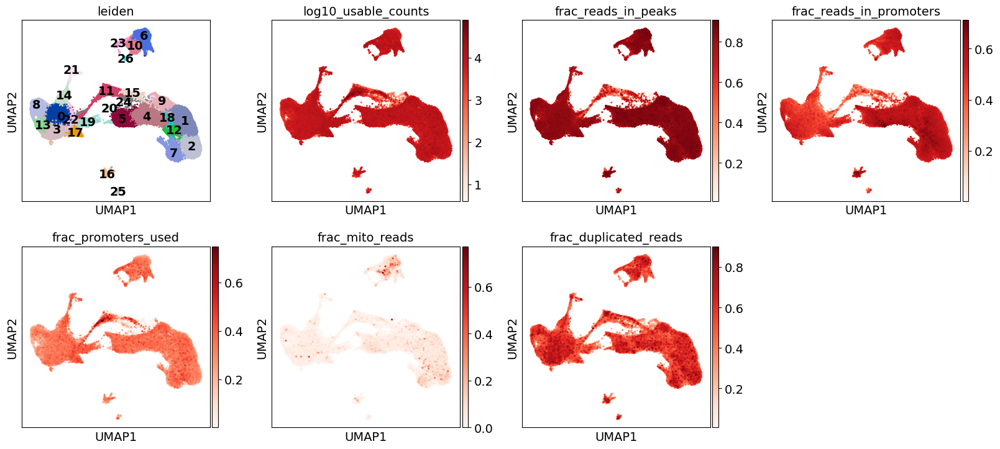

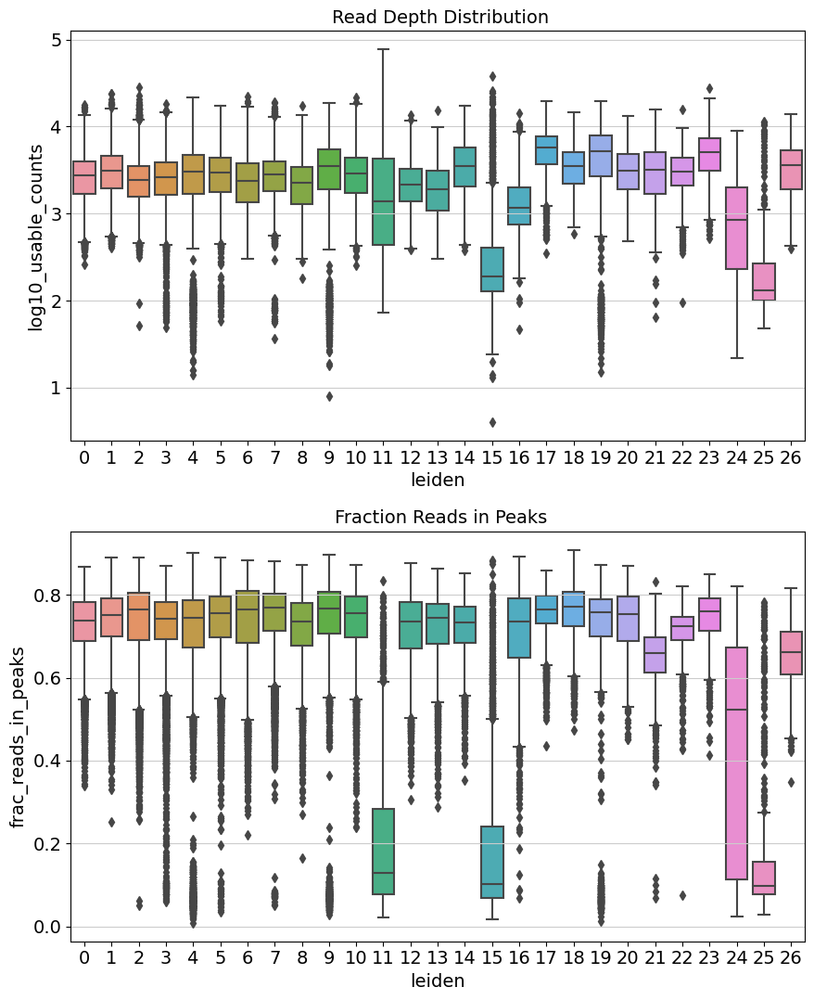

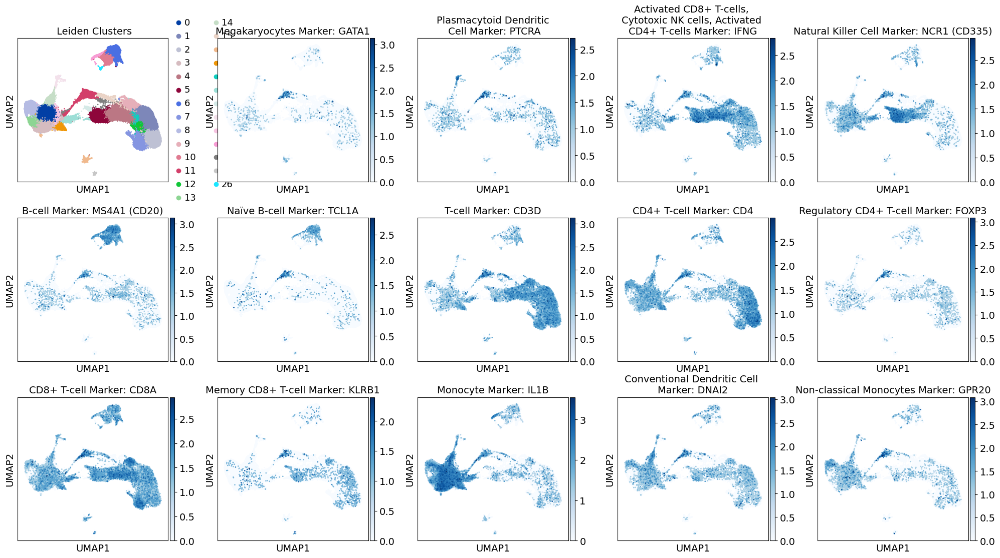

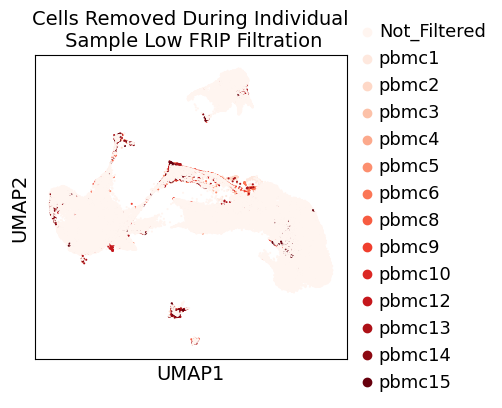

In [120]:
sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0)
sc.tl.leiden(adata_norm, resolution=1.25, random_state=0)
sc.tl.umap(adata_norm, min_dist=0.3, random_state=0)

sc.pl.umap(adata_norm, color=['leiden'], size=12, legend_loc='on data')
sc.pl.umap(adata_norm, color=['sample'], size=12,)
sc.pl.umap(adata_norm, color=['donor'], size=12,)
sc.pl.umap(adata_norm, color=['batchGroup'], size=12,)
sc.pl.umap(adata_norm, color=['leiden', 'log10_usable_counts', 'frac_reads_in_peaks', 'frac_reads_in_promoters', 'frac_promoters_used', 'frac_mito_reads', 'frac_duplicated_reads'], ncols=4, color_map='Reds', size=18, legend_loc='on data')



# boxplot of read depth distribution (reads within highly variable windows)
readDepthTitle =  " Read Depth Distribution"
fripTitle = " Fraction Reads in Peaks"
fig, ax1 = plt.subplots(2,1,figsize=(9,11))
sns.boxplot(x='leiden', y='log10_usable_counts', ax=ax1[0], data=adata_norm.obs).set_title(readDepthTitle)
sns.boxplot(x='leiden', y='frac_reads_in_peaks', ax=ax1[1], data=adata_norm.obs).set_title(fripTitle)
fig.tight_layout()

plt.show()


leidenTitle =  ' Leiden Clusters'
sc.pl.umap(adata_norm, \
           color= ['leiden', 'GATA1','PTCRA','IFNG', 'NCR1','MS4A1','TCL1A', \
                   'CD3D','CD4','FOXP3', 'CD8A','KLRB1','IL1B', 'DNAI2','GPR20'], \
           size=15, ncols = 5, color_map='Blues', frameon=True, \
           title= [leidenTitle, 'Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA', \
                     'Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG', \
                     'Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A',  \
                     'T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3',  \
                     'CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B', \
                     'Conventional Dendritic Cell \nMarker: DNAI2','Non-classical Monocytes Marker: GPR20'])



sc.pl.umap(adata_norm, color=['LowFRIP_Removal'], size=9, palette='Reds', frameon=True,title=['Cells Removed During Individual\n Sample Low FRIP Filtration']) # 

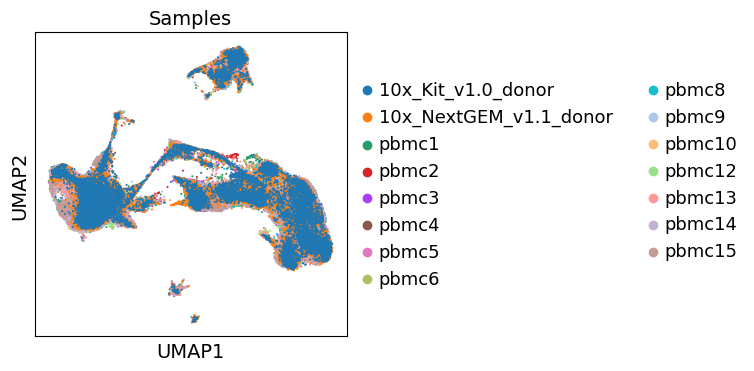

In [121]:
sc.pl.umap(adata_norm, color=['donor'], size=9, palette = sns.color_palette(), frameon=True,title=['Samples']) # 

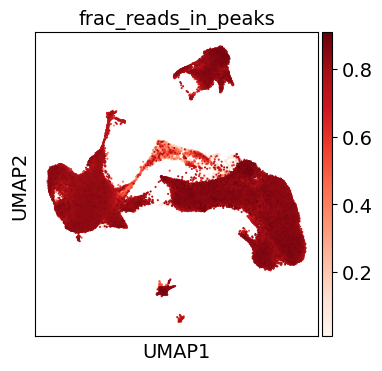

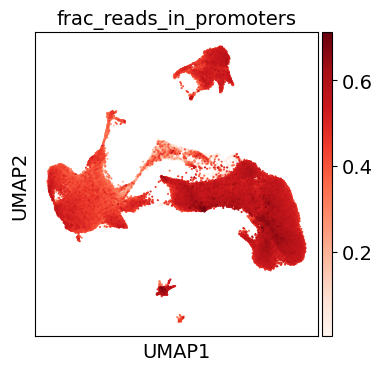

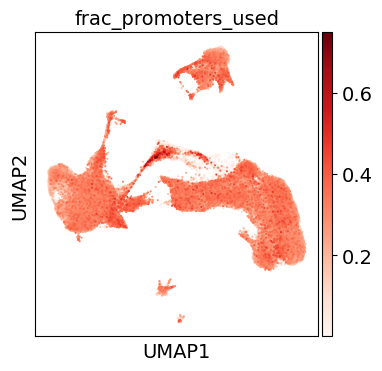

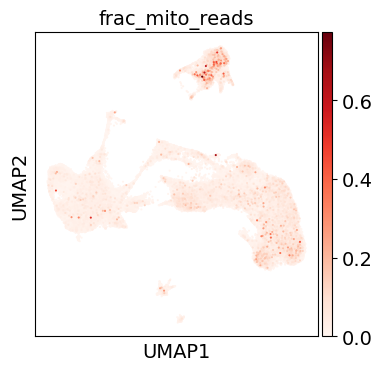

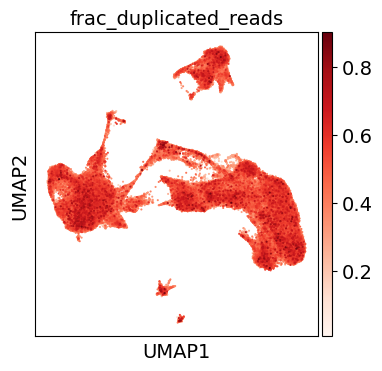

In [122]:
sc.pl.umap(adata_norm, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data')


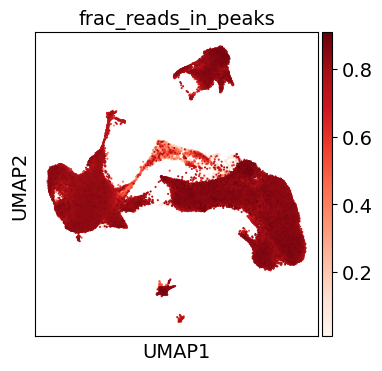

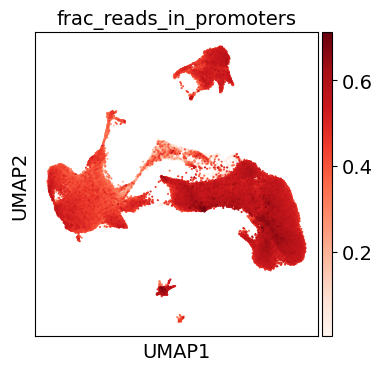

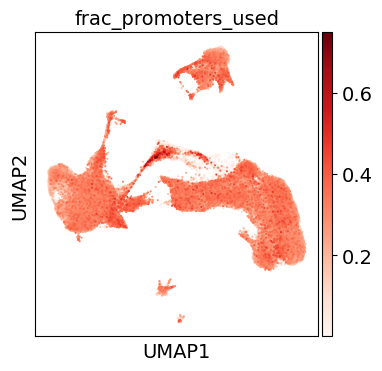

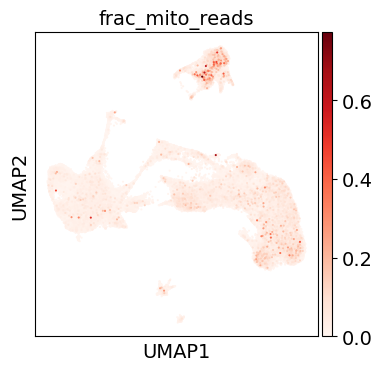

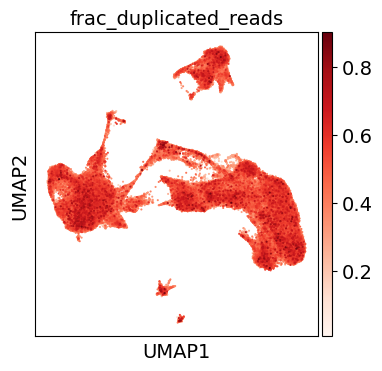

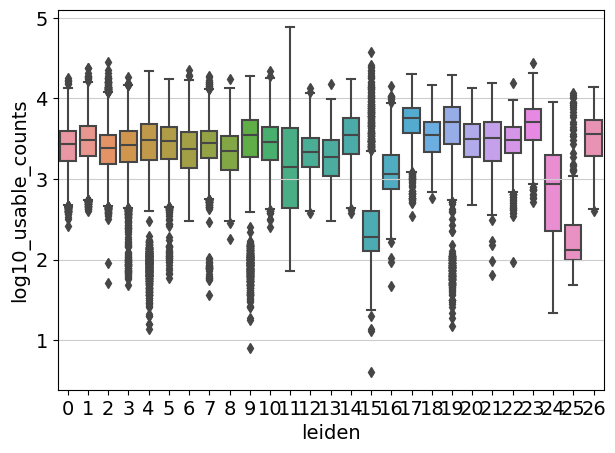

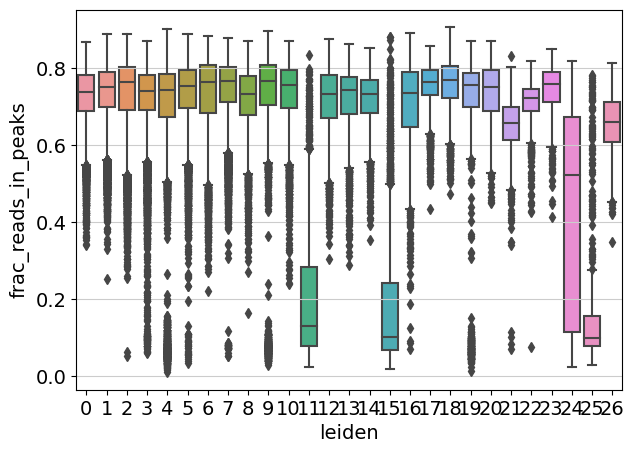

In [123]:
sc.pl.umap(adata_norm, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data')

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm.obs)
plt.show()

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm.obs)
plt.show()

In [124]:
len(adata_norm.obs)


148771

In [115]:

filterRemap = {'pbmc1' : 1, 
                'pbmc2' : 1,
                'pbmc3' : 1,
                'pbmc4' : 1,
                'pbmc5' : 1,
                'pbmc6'  : 1,
                'pbmc8'  : 1,
                'pbmc9'  : 1,
                'pbmc10' : 1,
                'pbmc12' : 1,
                'pbmc13'  : 1,
                'pbmc14'  : 1,
                'pbmc15'  : 1,
                 np.nan : 0}

In [116]:
adata_norm.obs['Filtered'] = adata_norm.obs['LowFRIP_Removal'].map(filterRemap)

In [57]:
# adata_norm_filt = adata_norm.copy()

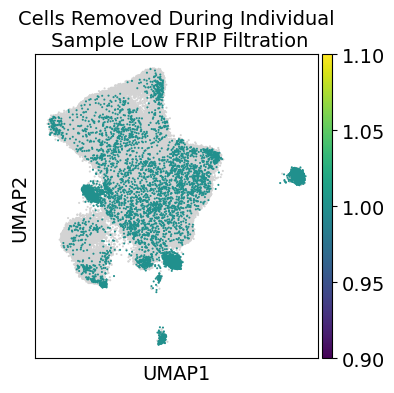

In [117]:
sc.pl.umap(adata_norm, color=['Filtered'], size=9, palette='Reds', frameon=True,title=['Cells Removed During Individual\n Sample Low FRIP Filtration']) # 

In [59]:
low_reads  = open(low_readsFile).read().splitlines()
# doublets   = open(os.path.join(wd,  'merged.doublets')).read().splitlines()
adata_norm_filt = adata_norm_filt[(~adata_norm_filt.obs.index.isin(low_reads)),:].copy()

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:59)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:44)


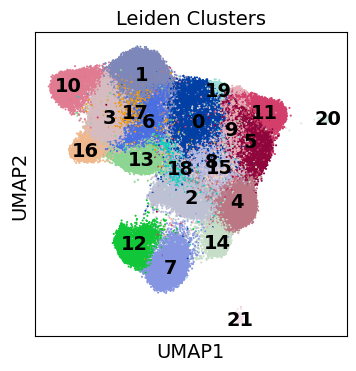

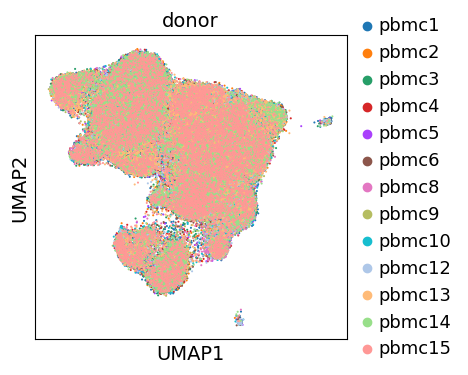

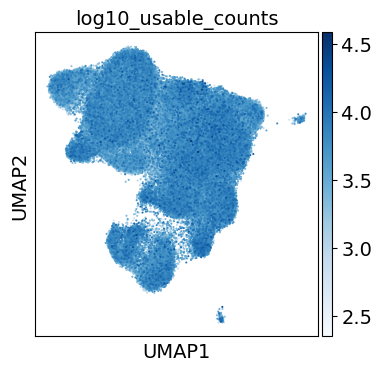

In [60]:
# figName_umapLeiden = "/cluster_" + filterStepName + "_UMAPLeiden.png"
# figName_umapDonor = "/cluster_" + filterStepName +  "_UMAPsample.png"
# figName_umapLog10Use = "/cluster_" + filterStepName + "_UMAPlog10UseableReads.png"    
sc.pp.neighbors(adata_norm_filt, n_neighbors=30, method='umap', metric='cosine', random_state=0, n_pcs = 20)
sc.tl.leiden(adata_norm_filt, resolution=1.25, random_state=0)
sc.tl.umap(adata_norm_filt, min_dist=0.3, random_state=0)

sc.pl.umap(adata_norm_filt, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
sc.pl.umap(adata_norm_filt, color=['donor'], size=9)
sc.pl.umap(adata_norm_filt, color=['log10_usable_counts'], size=9, color_map='Blues')


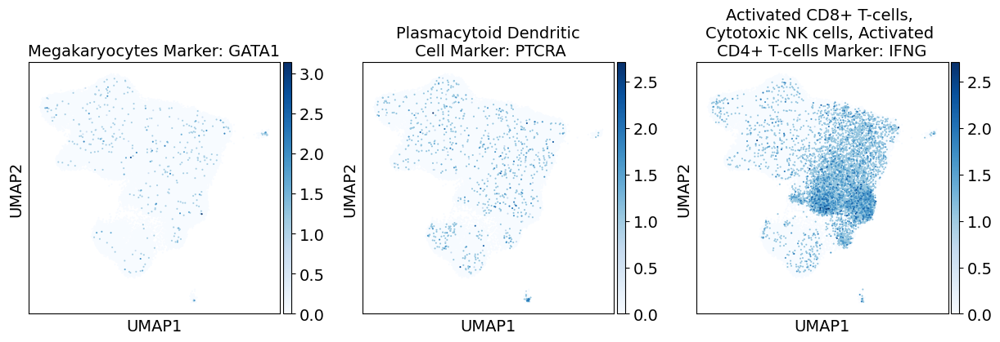

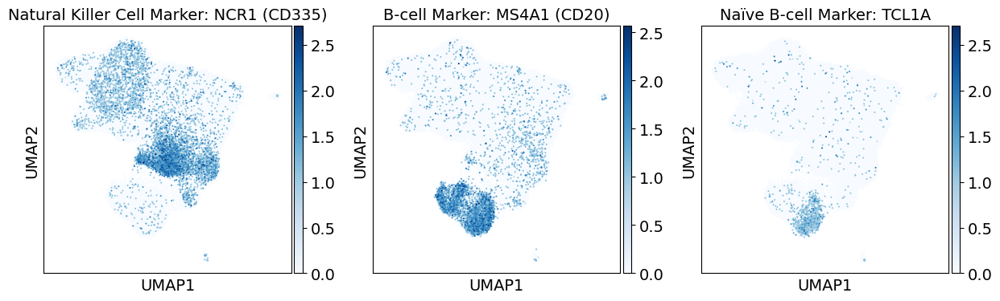

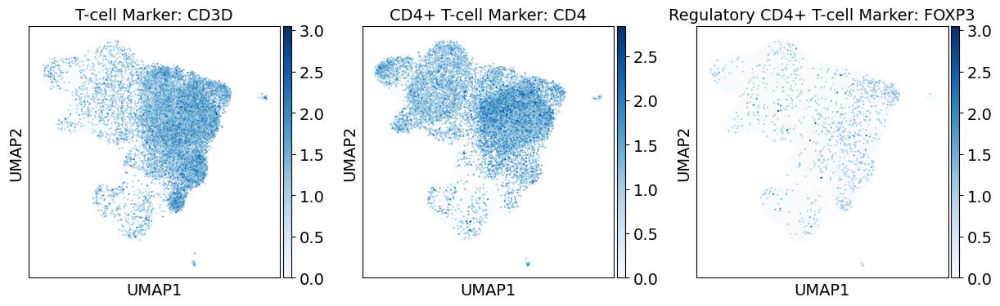

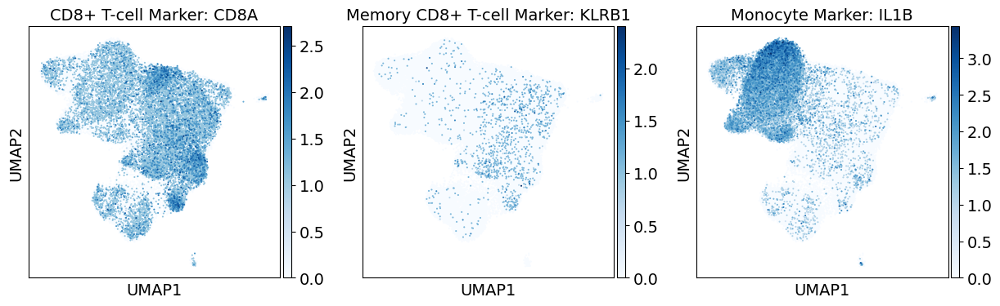

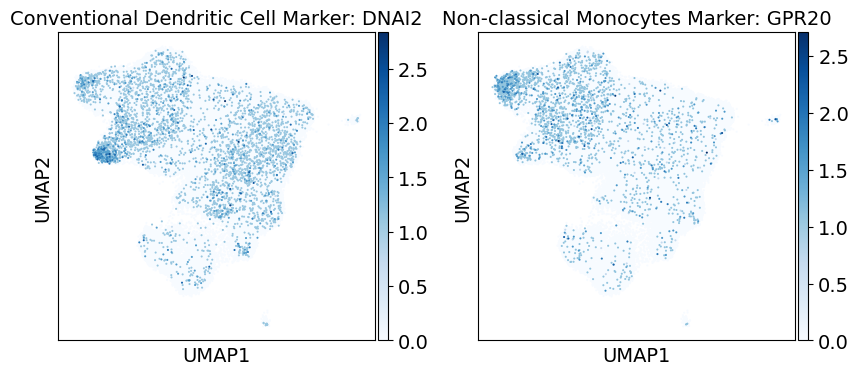

In [61]:
# plot marker promoter on UMAP coordinates
sc.pl.umap(adata_norm_filt, color=['GATA1','PTCRA','IFNG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA','Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG']) 
sc.pl.umap(adata_norm_filt, color=['NCR1','MS4A1','TCL1A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A']) # 
sc.pl.umap(adata_norm_filt, color=['CD3D','CD4','FOXP3'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3']) # 
sc.pl.umap(adata_norm_filt, color=['CD8A','KLRB1','IL1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B']) # 
sc.pl.umap(adata_norm_filt, color=['DNAI2','GPR20'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Conventional Dendritic Cell Marker: DNAI2','Non-classical Monocytes Marker: GPR20']) # 

In [62]:
adata_norm_filt = fixCategoricalValuesToNumeric (adata_norm_filt)

In [63]:
# makeFracUMAPs (adata_norm, filterStep, True, figureOutputDir )

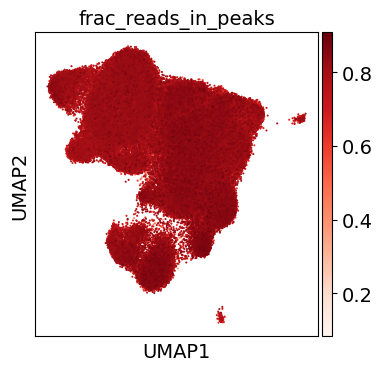

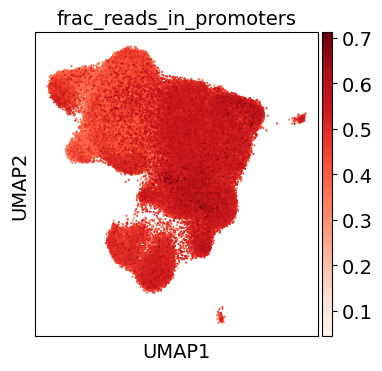

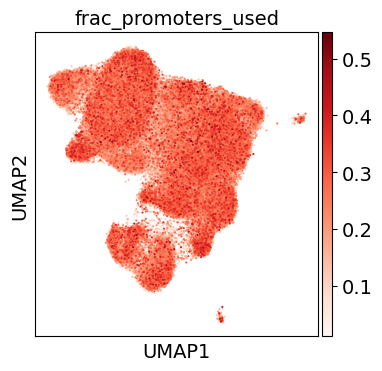

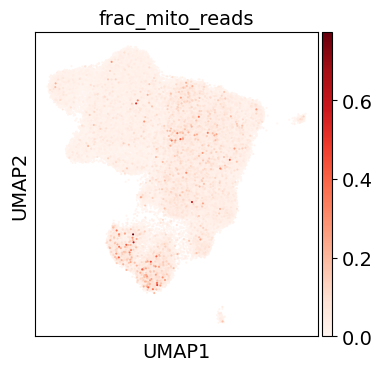

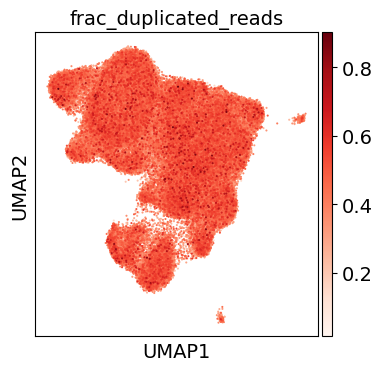

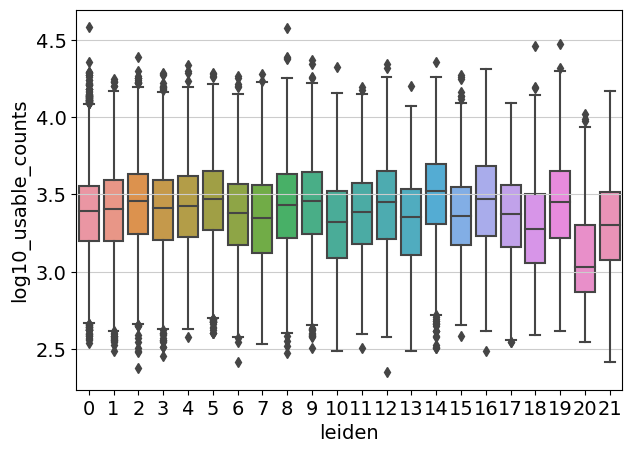

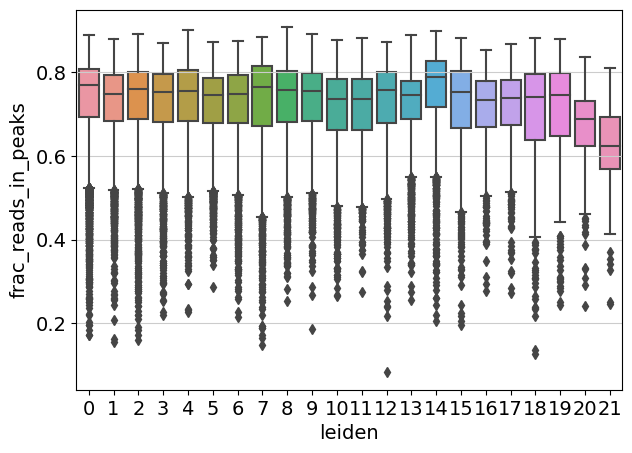

In [73]:
sc.pl.umap(adata_norm_filt, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm_filt, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm_filt, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm_filt, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm_filt, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data')

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm_filt.obs)
plt.show()

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm_filt.obs)
plt.show()

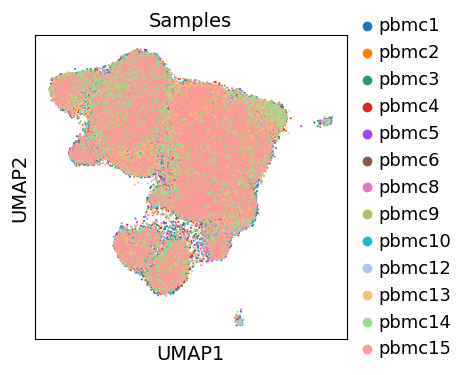

In [65]:
sc.pl.umap(adata_norm_filt, color=['donor'], size=9,  frameon=True,title=['Samples']) # 

In [66]:

h5ad_filter = "/nfs/lab/jnewsome/pbmc_tenX_pipelineTemp/pbmc1_15.merged_samples_v2.merge5_filter.h5ad"
adata_norm_filt.write_h5ad(h5ad_filter)

In [138]:
adata_merged_orig

In [118]:
adata_norm2 = adata_norm.copy()

In [119]:

removeRows = adata_norm2.obs.loc[(adata_norm2.obs['leiden'].isin(['19', '20' ]))]
print(len(removeRows))

# adata_norm.obs.loc[(adata_norm.obs['leiden'].isin(['12', '19', '21', '22' ]))].to_csv(os.path.join(wd, 'pbmc.merged_samples_1to12.lowfrip2'), header=None, columns=[])



3401


In [121]:
removeRows

,donor,Unnamed: 0,unique_usable_reads,total_sequenced_reads,duplicated_reads,unique_mito_reads,reads_in_peaksreads_in_promoters,tss_used,frac_reads_in_peaks,frac_reads_in_promoters,frac_promoters_used,frac_mito_reads,frac_duplicated_reads,log10_unique_usable_reads,n_counts,LowFRIP_Removal,log10_usable_counts,norm,leiden,Filtered
pbmc1_AAACTCGTCAGTACAC,pbmc1,5771,8329,2518,0,3127,1859,846,0.541847,0.322128,0.043730,0.000000,0.302317,3.920645,5974.0,NaN,2.918030,0,19,NaN
pbmc1_AAATGAGCATGGTTTG,pbmc1,4596,6424,1814,0,412,238,85,0.089643,0.051784,0.004394,0.000000,0.282379,3.807873,4744.0,pbmc1,1.913814,0,20,1.0
pbmc1_AAATGAGGTGTTGTTG,pbmc1,14413,22154,7574,61,9480,5085,2109,0.657740,0.352806,0.109015,0.004214,0.341880,4.345472,14785.0,NaN,3.317646,0,19,NaN
pbmc1_AACAAAGCAACTAGAA,pbmc1,159002,210627,49481,52,8536,3128,1158,0.053685,0.019673,0.059857,0.000327,0.234922,5.323516,163981.0,pbmc1,3.388811,0,19,1.0
pbmc1_AACAAAGGTCCAAGAG,pbmc1,171247,229135,55793,0,9973,3349,1168,0.058238,0.019557,0.060374,0.000000,0.243494,5.360093,176363.0,pbmc1,3.436640,0,19,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pbmc15_TTTACGTTCTCAGATG,pbmc15,14298,22349,7966,4,11453,7813,3001,0.801021,0.546440,0.155123,0.000280,0.356437,4.349278,14691.0,NaN,3.440437,12,19,NaN
pbmc15_TTTGAGGTCGATATGC,pbmc15,11285,19360,7735,4,399,190,64,0.035357,0.016837,0.003308,0.000354,0.399535,4.286928,11562.0,pbmc15,2.089905,12,20,1.0
pbmc15_TTTGGCCAGTGTCCCG,pbmc15,56484,88517,31251,0,3802,1677,562,0.067311,0.029690,0.029050,0.000000,0.353051,4.947032,58224.0,pbmc15,3.070776,12,19,1.0
pbmc15_TTTGTGTAGGCAGTGT,pbmc15,4472,7255,2733,0,362,158,60,0.080948,0.035331,0.003101,0.000000,0.376706,3.860697,4649.0,pbmc15,2.071882,12,20,1.0


In [128]:
removeBar = removeRows.index.tolist()

In [132]:
# doublets   = open(os.path.join(wd,  'merged.doublets')).read().splitlines()
#adata_norm2 = adata_norm2[(~adata_norm_filt.obs.index.isin(removeBar)),:].copy()
adata_norm2 = adata_norm2[(~adata_norm2.obs.index.isin(removeBar)),:]

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:16)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:48)


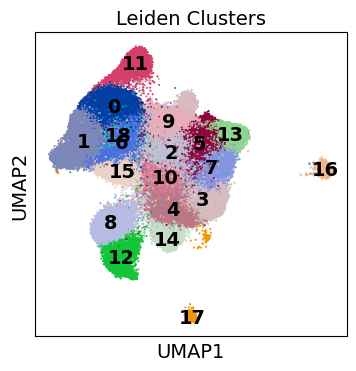

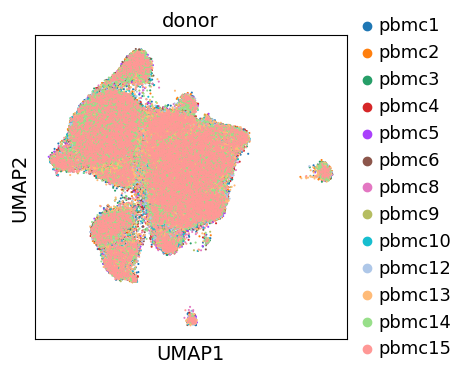

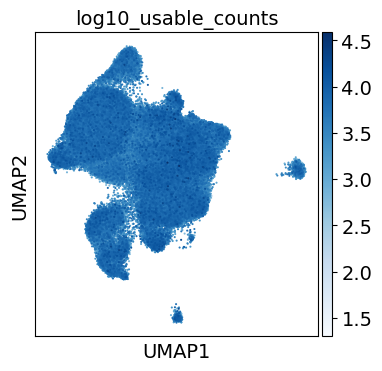

In [133]:
# figName_umapLeiden = "/cluster_" + filterStepName + "_UMAPLeiden.png"
# figName_umapDonor = "/cluster_" + filterStepName +  "_UMAPsample.png"
# figName_umapLog10Use = "/cluster_" + filterStepName + "_UMAPlog10UseableReads.png"    
sc.pp.neighbors(adata_norm2, n_neighbors=30, method='umap', metric='cosine', random_state=0)
sc.tl.leiden(adata_norm2, resolution=1.25, random_state=0)
sc.tl.umap(adata_norm2, min_dist=0.3, random_state=0)

sc.pl.umap(adata_norm2, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
sc.pl.umap(adata_norm2, color=['donor'], size=9)
sc.pl.umap(adata_norm2, color=['log10_usable_counts'], size=9, color_map='Blues')


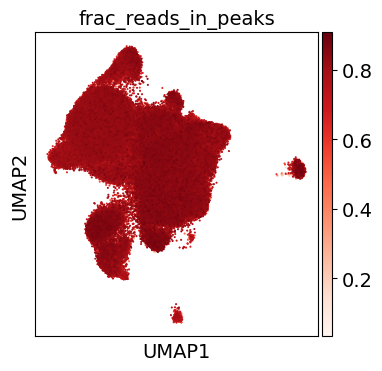

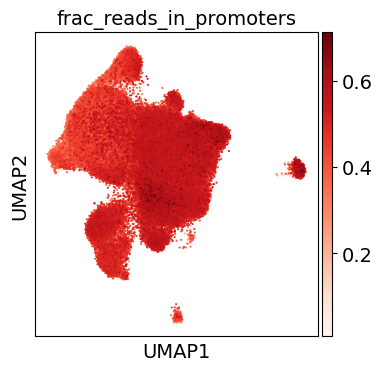

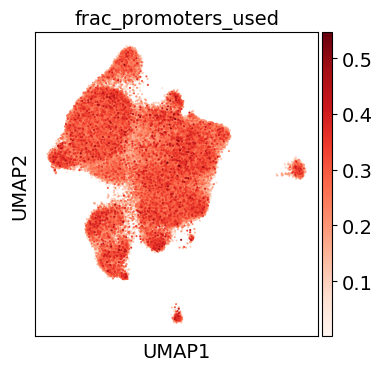

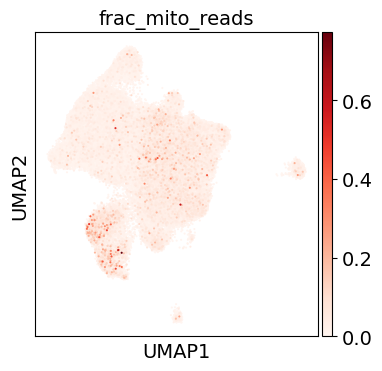

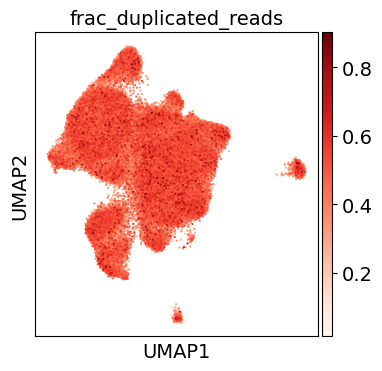

...

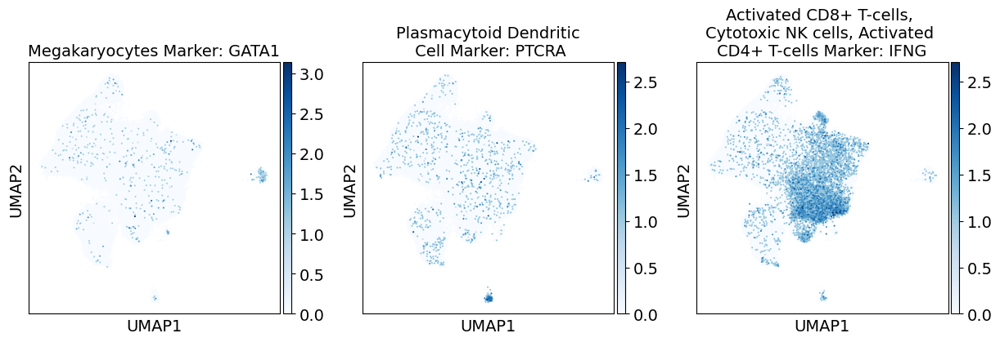

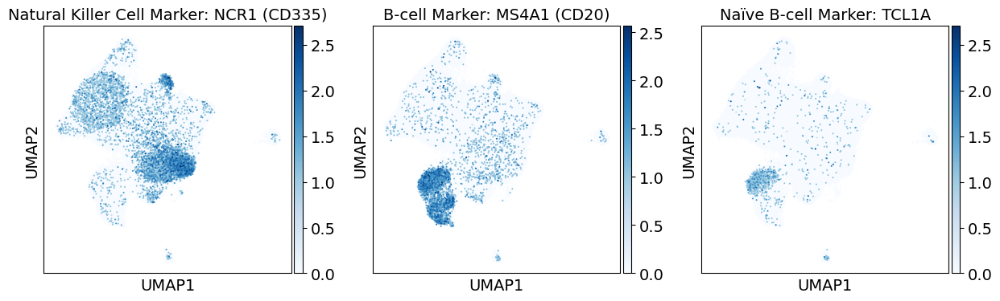

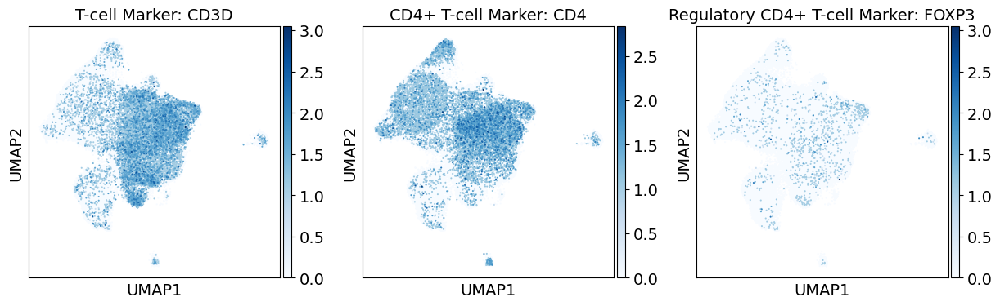

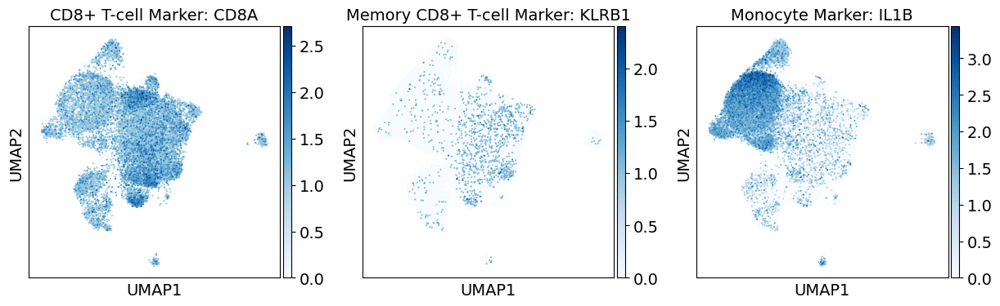

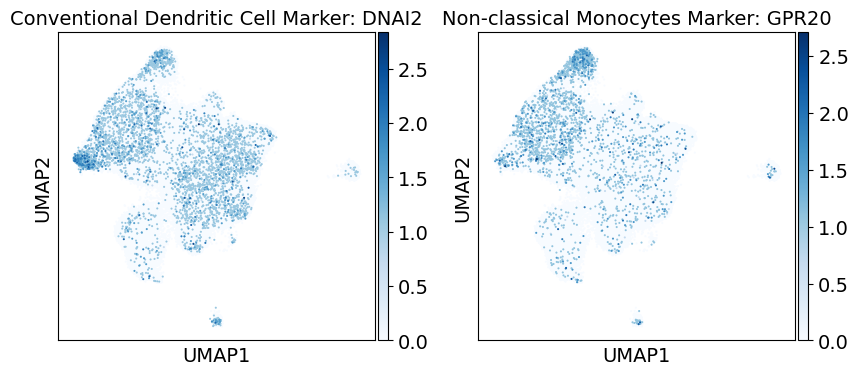

In [135]:
adata_norm_filt = fixCategoricalValuesToNumeric (adata_norm_filt)
sc.pl.umap(adata_norm2, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data')

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm2.obs)
plt.show()

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm2.obs)
plt.show()
# plot marker promoter on UMAP coordinates
sc.pl.umap(adata_norm2, color=['GATA1','PTCRA','IFNG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA','Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG']) 
sc.pl.umap(adata_norm2, color=['NCR1','MS4A1','TCL1A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A']) # 
sc.pl.umap(adata_norm2, color=['CD3D','CD4','FOXP3'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3']) # 
sc.pl.umap(adata_norm2, color=['CD8A','KLRB1','IL1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B']) # 
sc.pl.umap(adata_norm2, color=['DNAI2','GPR20'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Conventional Dendritic Cell Marker: DNAI2','Non-classical Monocytes Marker: GPR20']) # 




computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:46)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:26)


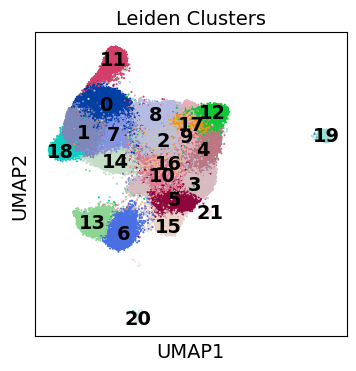

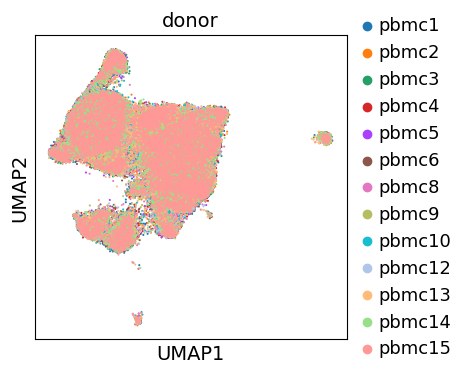

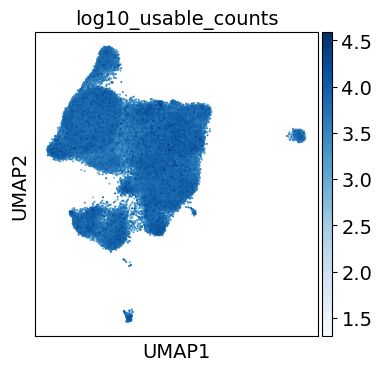

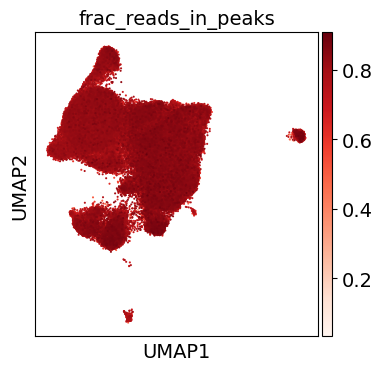

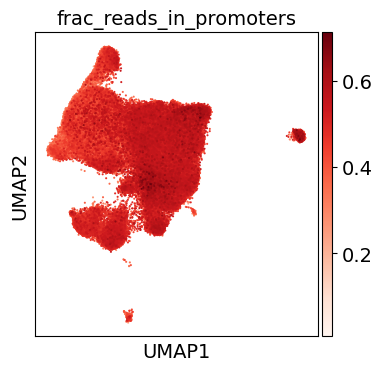

...

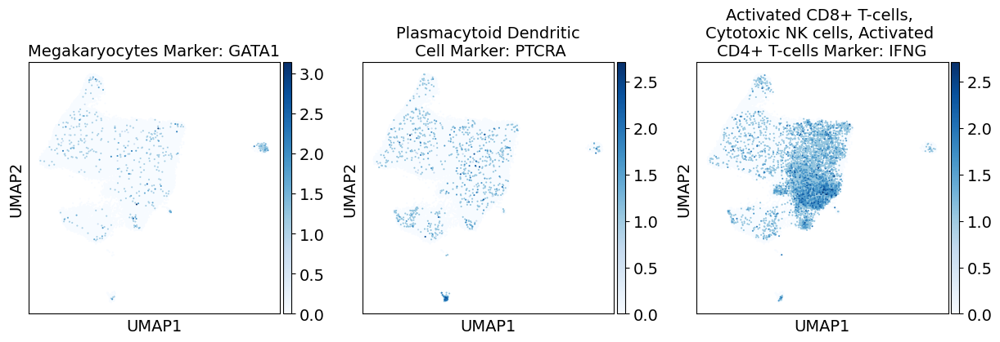

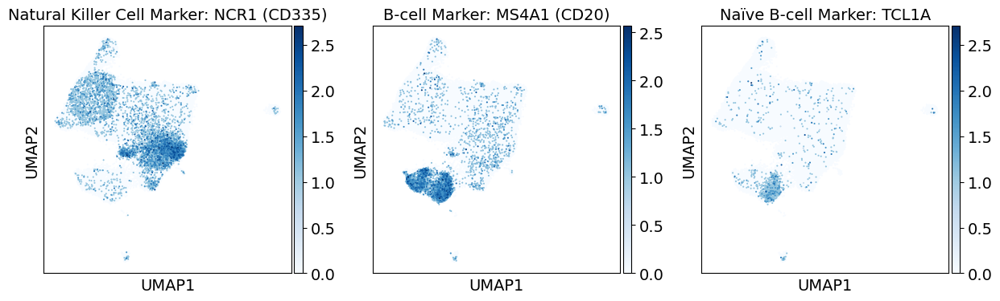

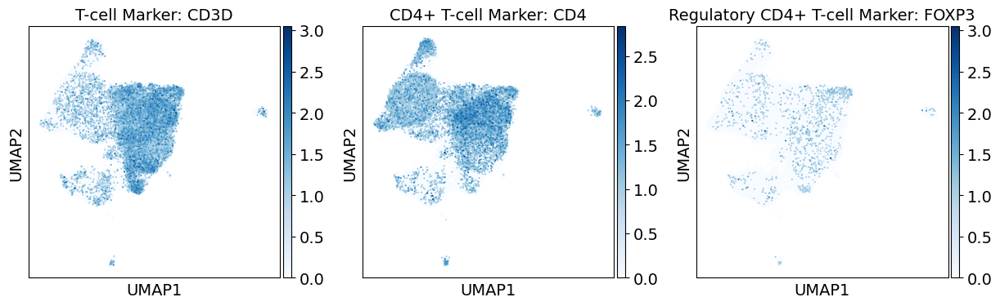

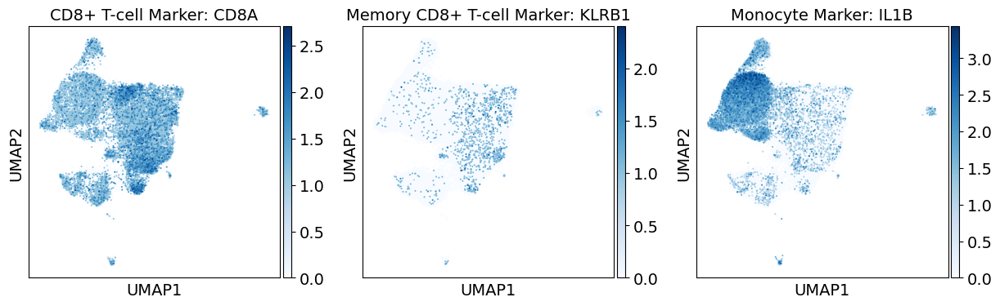

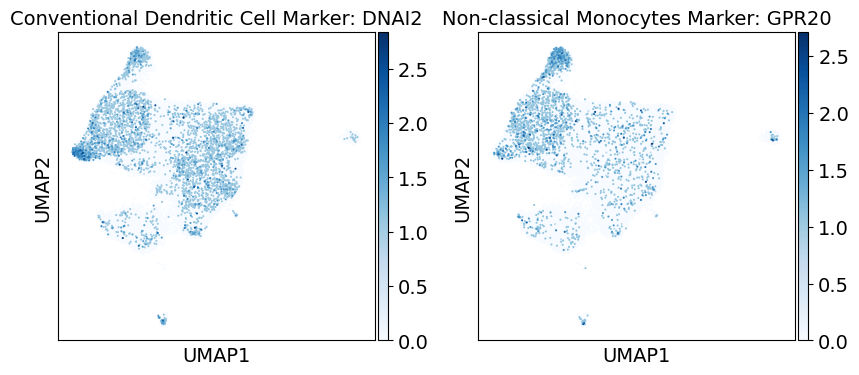

In [137]:
# figName_umapLeiden = "/cluster_" + filterStepName + "_UMAPLeiden.png"
# figName_umapDonor = "/cluster_" + filterStepName +  "_UMAPsample.png"
# figName_umapLog10Use = "/cluster_" + filterStepName + "_UMAPlog10UseableReads.png"    
sc.pp.neighbors(adata_norm2, n_neighbors=20, method='umap', metric='cosine', random_state=0)
sc.tl.leiden(adata_norm2, resolution=1.25, random_state=0)
sc.tl.umap(adata_norm2, min_dist=0.2, random_state=0)

sc.pl.umap(adata_norm2, color=['leiden'], size=9, legend_loc='on data', title='Leiden Clusters') 
sc.pl.umap(adata_norm2, color=['donor'], size=9)
sc.pl.umap(adata_norm2, color=['log10_usable_counts'], size=9, color_map='Blues')
adata_norm_filt = fixCategoricalValuesToNumeric (adata_norm_filt)
sc.pl.umap(adata_norm2, color=['frac_reads_in_peaks'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_reads_in_promoters'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_promoters_used'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_mito_reads'], cmap='Reds', size=9, legend_loc='on data')
sc.pl.umap(adata_norm2, color=['frac_duplicated_reads'], cmap='Reds', size=9, legend_loc='on data')

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='log10_usable_counts', data=adata_norm2.obs)
plt.show()

fig, ax1 = plt.subplots(1,1,figsize=(7,5))
sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm2.obs)
plt.show()
# plot marker promoter on UMAP coordinates
sc.pl.umap(adata_norm2, color=['GATA1','PTCRA','IFNG'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Megakaryocytes Marker: GATA1','Plasmacytoid Dendritic\n Cell Marker: PTCRA','Activated CD8+ T-cells, \nCytotoxic NK cells, Activated \nCD4+ T-cells Marker: IFNG']) 
sc.pl.umap(adata_norm2, color=['NCR1','MS4A1','TCL1A'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Natural Killer Cell Marker: NCR1 (CD335)','B-cell Marker: MS4A1 (CD20)','Naïve B-cell Marker: TCL1A']) # 
sc.pl.umap(adata_norm2, color=['CD3D','CD4','FOXP3'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['T-cell Marker: CD3D','CD4+ T-cell Marker: CD4','Regulatory CD4+ T-cell Marker: FOXP3']) # 
sc.pl.umap(adata_norm2, color=['CD8A','KLRB1','IL1B'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['CD8+ T-cell Marker: CD8A','Memory CD8+ T-cell Marker: KLRB1','Monocyte Marker: IL1B']) # 
sc.pl.umap(adata_norm2, color=['DNAI2','GPR20'], size=9, color_map='Blues', frameon=True, use_raw=True, title=['Conventional Dendritic Cell Marker: DNAI2','Non-classical Monocytes Marker: GPR20']) # 




In [ ]:
#sc.pl.dotplot(adata, ['C1QA', 'PSAP', 'CD79A', 'CD79B', 'CST3', 'LYZ'],
#              groupby='bulk_labels', dendrogram=True)
#Using var_names as dict: >>> markers = {‘T-cell’: ‘CD3D’, ‘B-cell’: ‘CD79A’, ‘myeloid’: ‘CST3’} 
#>>> sc.pl.dotplot(adata, markers, groupby=’bulk_labels’, dendrogram=True)

ax = sc.pl.dotplot(pbmc, subset_genes, groupby='leiden',
                    var_group_positions=[(0,1), (11, 12)],
                    var_group_labels=['B cells', 'dendritic'],
                    figsize=(12,4), var_group_rotation=0, dendrogram='dendrogram_leiden')



In [54]:
#removeRows = adata.obs.loc[adata.obs.index.isin(removeBarcodes)]


removeRows = adata_norm.obs.loc[(adata_norm.obs['leiden'].isin(['12', '19', '21', '22' ]))]
print(len(removeRows))

adata_norm.obs.loc[(adata_norm.obs['leiden'].isin(['12', '19', '21', '22' ]))].to_csv(os.path.join(wd, 'pbmc.merged_samples_1to12.lowfrip2'), header=None, columns=[])


1742


### Subclustering to remove doublets

In [ ]:
#adata_norm = sc.read("/home/jnewsome/pbmc.merged_samples_v3.h5ad")

In [ ]:
adata = adata_norm.copy()

In [ ]:
adataObsTemp, subClusterDict = createAllSubClusters (adata_norm, subClusterDict, subset_genes, figureOutputDir, filterStep, True )

In [ ]:
subClustersToRemoveRound1 = []
removeRows = getDFOfRowsToRemove (adata_norm, subClustersToRemoveRound1, subClusterDict)
removeRows.head()
removeRows.to_csv(os.path.join(wd, outputFilteredBarcodeFile), header=False, columns=[])

## Annotate Clusters

In [ ]:
adata_norm = sc.read("")
adata = adata_norm.copy()

In [ ]:
adata_norm = adata.copy()

In [ ]:
low_reads  = open('/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterBarcodeFiles/pbmc.merged_samples_1to12.lowfrip').read().splitlines()

doublets1   = open(os.path.join(wd,  'merged_v3.doublets1')).read().splitlines()
doublets2   = open(os.path.join(wd,  'merged_v3.doublets2')).read().splitlines()
doublets3   = open(os.path.join(wd,  'merged_v3.doublets3')).read().splitlines()
doublets4   = open(os.path.join(wd,  'merged_v3.doublets4')).read().splitlines()
doublets5   = open(os.path.join(wd,  'merged_v3.doublets5')).read().splitlines()

adata_norm = adata_norm[(~adata_norm.obs.index.isin(low_reads)) 
                        & (~adata_norm.obs.index.isin(doublets1))
                        & (~adata_norm.obs.index.isin(doublets2))
                        & (~adata_norm.obs.index.isin(doublets3))
                        & (~adata_norm.obs.index.isin(doublets4))
                        & (~adata_norm.obs.index.isin(doublets5)),:].copy()


filterStep = 'v3_AfterDoubletFilter5'
filterStepName_v3Doublet5 = "v3_AfterDoubletFilter5"
adata_norm = clusterData (adata_norm, filterStepName_v3Doublet5, True )
adata_norm = fixCategoricalValuesToNumeric (adata_norm)
adata_norm = makeOlderVersionMarkerUmaps (adata_norm, filterStepName_v3Doublet5, True)

figureOutputDir = "/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterNotebooks/figures/umap/"
subset_genes = ['CD14','MAFB','IL1B',
                'CD19','MS4A1','CD79A',
                'CD4','IL2RA','CD3D',
                'CD8A','NFIC','FASLG',
                'NCAM1','NCR1','SH2D1B',
                'ITGA2B','PTGER3','CD9',
                'PTCRA','LAMP5','RGS7']

subClusterDict = dict()

adata_norm = makeFracUMAPs (adata_norm, filterStepName_v3Doublet5, True, figureOutputDir )

figureOutputDir = "/nfs/lab/projects/pbmc_snATAC/pipeline/snATAC/clusterNotebooks/figures/umap/"

subClusterDict = dict()

In [ ]:
wd2 = '/home/jnewsome'
adata_norm.write_h5ad(os.path.join(wd2, 'pbmc.merged_samples_v3_after5thDoublet.h5ad'))

In [ ]:
class GeneCellTypeThing (object):
    def __init__(self, gene, celltypes, title, source):
        self.gene = gene
        self.celltypes = celltypes
        self.title = title
        self.source = source
        
geneCellTypeDict = dict()
subset_genes_orig = list()
for index, row in subset_geneCellTypeTable.iterrows():
    #print(row['c1'], row['c2'])
    gene = row['Gene']
    cellTypes = row['CellType']
    title = row['Title']
    source = row['Sources']
    
    celltypes = cellTypes.split(";")
    gctt = GeneCellTypeThing(gene, celltypes, title, source)
    geneCellTypeDict[gene] = gctt
    if not gene in subset_genes_orig:
        subset_genes_orig.append(gene)

In [ ]:
possibleCellTypeList = ['b_cell', 'b_cell_memory', 'b_cell_naive',
                        'basophil', 'dendritic_cell', 'dendritic_cell_conventional'
                        'dendritic_cell_plasmacytoid', 'eosinophil', 'hematopoietic_stem_cell', 
                        'macrophage', 'megakaryocyte', 'monocyte', 
                        'monocyte_classical', 'monocyte_non-classical', 'neutrophil', 
                        'nk_cell', 'nk_cell_adaptive', 'nk_cell_cytotoxic', 
                        'plasma_cell', 'platelet_activated', 'platelet_resting', 
                        'red_blood_cell', 't_cell', 't_cell_activated', 
                        't_cell_activated_CD4', 't_cell_activated_CD8', 't_cell_naive', 
                        't_cell_CD4', 't_cell_CD8', 
                        't_cell_naive_CD4', 
                        't_cell_naive_CD8', 
                        't_cell_regulatory']

newGeneCellTypeDict = dict()
subset_genes = list()
for gene in subset_genes_orig:
    if gene in adata.raw.var.index:
        for ct in geneCellTypeDict[gene].celltypes:
            if ct in possibleCellTypeList:
                newGeneCellTypeDict[gene] = geneCellTypeDict[gene]
                subset_genes.append(gene)



### Assign Labels

In [ ]:
cluster_labels = { '0':'Monocytes',
                   '1':'CD4-T-cell', '2':'CD4-T-cell', 
                   '3':'NK-cell', '4':'NK-cell', '5':'CD4-T-cell', 
                   '6':'B-cell', '7':'Monocytes', '8':'Monocytes', '9':'CD4-T-cell',
                   '10':'Monocytes', '11':'CD8-T-cell', '12':'B-cell', 
                   '13':'Monocytes', '14':'CD8-T-cell', '15':'Monocytes',
                   '16':'NK-cell', '17':'Megakaryocytes', '18':'B-cell', '19':'pDCs'}


In [ ]:
clusters = pd.DataFrame(adata_norm.obsm['X_umap'], columns=['UMAP1','UMAP2'], index=adata_norm.obs.index)
clusters['leiden'] = clusters.index.map(adata_norm.obs['leiden'])
clusters['cluster'] = clusters['leiden'].map(cluster_labels)
clusters.to_csv(os.path.join(wd,  'pbmc.merged.cluster_labels.AfterDoublet5.txt'), sep='\t')